# Setup

Retrieve "GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv" from [this GitHub link](https://github.com/nasa/GeneLab_Data_Processing/blob/master/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files/GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv) and save it in the same directory as this notebook. The GitHub path is `nasa/GeneLab_Data_Processing/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files`.



Possible Map My Cells region keys = ["RHP", "RSP", "ACA", "PL-ILA-ORB", "AUD-TEa-PERI-ECT", "SS-GU-VISC", "MO-FRP", "PAL", "sAMY", "CTXsp", "HY", "STRv", "OLF", "LSX", "AI", "STRd", "VIS-PTLp", "VIS", "TH", "MOp", "ENT", "HIP", "P", "MB", "MY", "CB", "AUD", "SSp", "TEa-PERI-ECT"]

---

**Use Conda**

While in the folder containing this notebook:
`conda env create -f rapidsc.yml`



Navigate back to where you want to clone the `scflow` repository (I recommend home)
`cd`

Clone `scflow` from GitHub.
`git clone git@github.com:easlinger/scflow.git`

Navigate to the folder where `scflow` is:
`pip install .`

`pip install senepy`

---

**For NVIDIA Drivers (Linux)**

```
sudo apt update
sudo apt install -y build-essential dkms

sudo apt install -y wget
wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/cuda-ubuntu2204.pin
sudo mv cuda-ubuntu2204.pin /etc/apt/preferences.d/cuda-repository-pin-600
sudo apt-key adv --fetch-keys https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/3bf863cc.pub
sudo add-apt-repository "deb https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64/ /"

sudo apt update
sudo apt install -y cuda
```

---


## Imports & Display

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import re
import logging
import json
try:
    import torch
    torch.set_float32_matmul_precision("medium")
except Exception:
    pass
# try:
#     import rapids_singlecell as rsc
# except Exception:
#     rsc = None
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import pandas as pd
import numpy as np
import scflow

pd.set_option("display.max_rows", 500)  # or None for unlimited rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 200)


class CategoricalFilter(logging.Filter):
    def filter(self, record):
        return "storing" not in record.getMessage() or \
               "as categorical" not in record.getMessage()


logger = logging.getLogger("anndata")
logger.addFilter(CategoricalFilter())

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/jaxopt/__init__.py:59: DeprecationWarning: JAXopt is no longer maintained. See https://docs.jax.dev/en/latest/ for alternatives.
  warnings.warn(
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/__init__.py:17: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  __version_info__ = tuple(LooseVersion(__version__).version)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/fields.py:198: RemovedInMarshmallow4Warning: Passing field metadata as a keyword arg is deprecated. Use the explicit `metadata=...` argument instead.
  warnings.warn(
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/pkg_resources/__init__.py:3146: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('sphinxcontrib')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_nam

## Set Options (ACTIVELY SET THESE!)

In [ ]:
# Processors to Use
n_processors = os.cpu_count() - 1  # how many processors to use

# If You Want Results Emailed
cur_file = os.path.join(os.path.abspath(""), "create_object_613.ipynb")
html_out = os.path.splitext(cur_file)[0] + ".html"
email = "elizabeth.aslinger@aya.yale.edu"
# set email to None to skip

# Set Data Sources & Species
species = "Mouse"
batches = ["OSD-613"]  # in list even if just 1, or list multiple to integrate

# Set Source Data Directory & Output Options
superdirec = "/home/easlinger/data"  # directory with original data
direcs = [os.path.join(superdirec, i) for i in batches]
# new h5ad will write to "data" sub-directory of where this notebook is
overwrite = True  # allow overwrite of files?
file_concat = os.path.join("data", f"{'_'.join(batches)}_concatenated.h5ad")
file_new = os.path.join("data", f"{'_'.join(batches)}_integrated.h5ad")

# Set Sample & Batch IDs, Plus Other Potential Sources of Batch Effects
col_group = "Group"  # age &/or space flight
col_age = "Characteristics[Age at Euthanasia]"
# col_age = "Factor Value[Age]"
col_condition = "Factor Value[Spaceflight]"
col_sample = "sample"
col_batch = "batch" if len(batches) > 1 else col_group  # group=batch if 1
# covariates_categorical = ["Comment[Euthanasia Date]"]
# covariates_continuous = ["Time"]
covariates_categorical = None
covariates_continuous = None

# Do Sub-Clustering?
# subcluster_biggest = 1  # sub-cluster biggest cluster
# subcluster_biggest = 3  # sub-cluster biggest 3 clusters
subcluster_biggest = False  # no sub-clustering
kws_cluster = dict(n_comps=50)  # cluster individual samples
# kws_cluster = None  # do not cluster individual samples
# vars_regress_out = ["Time", "pct_counts_mt",
#                     "total_counts"]  # to regress out of concatenated object
vars_regress_out = None

# Set Annotation Sources
map_my_cells_source = "WMB-10X" if species == "Mouse" else "WHB-10X" if (
    species == "Human") else None  # Map My Cells atlas source
# map_my_cells_region_keys = None
map_my_cells_region_keys = [
    "RSP", "ACA", "PL-ILA-ORB", "AUD-TEa-PERI-ECT", "SS-GU-VISC", "MO-FRP",
    "AI", "VIS-PTLp", "VIS", "MOp", "AUD", "SSp",
    "TEa-PERI-ECT"]  # regional subset for Map My Cells
map_my_cells_cell_keys = ["Isocortex"]  # pattern match: feature name column
if species == "Mouse":
    model_celltypist = "Mouse_Whole_Brain.pkl"
else:
    raise ValueError("Manually set CellTypist model for non-mouse!")
source_patterns = ["Brain", "Cortical", "cortex"]  # for ToppGene

# Make Pre-Defined Marker Dictionary
cts_superhierarchical = {
    "Neuron": ["Excitatory", "Inhibitory", "Glutamatergic", "GABAergic",
               "Dopaminergic", "Serotonergic", "Cholinergic"]
}  # if classified as Neuron + other, just keep more specific type(s)
rename_marker_based_annotation = {
    "Excitatory | Inhibitory": "Excitatory-Inhibitory",
    "Inhibitory | Inhibitory": "Excitatory-Inhibitory"
}
mks_a_priori = pd.read_csv("GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv")
mks_a_priori.loc[:, "cellName"] = mks_a_priori.cellName.replace({
    "Oligodendrocyte precursor cell": "OPC"}).apply(
        lambda x: " ".join([i.capitalize() for i in re.sub(
            " cell", "", x).split(" ")])).replace({
                "Opc": "OPC"})  # capitalize cell names
mks_a_priori = mks_a_priori.set_index("cellName")["geneSymbol"]
mks_a_priori = dict(mks_a_priori.apply(lambda x: set(x.split(","))))
mks_a_priori.update({
    "Neuroepithelial": {"Nes", "Notch1", "Sox2", "Sox10", "Hes1", "Hes3"},
    "Excitatory": {"Slc17a7", "Slc30a3", "Tcf4",
                   "Slc17a6", "Slc6a1", "Baiap3",
                   "Grin1", "Grin2b", "Gls"},
    "Inhibitory": {"Gad1", "Slc6a1", "Gabbr1", "Gabbr2",
                   "Gad2", "Slc32a1", "Oprm1", "Htr2c"},
    # "Glutamatergic": {"Slc17a7", "Slc17a6", "Grin1", "Grin2b", "Gls"},
    # "GABAergic": {"Slc6a1", "Gabbr1", "Gabbr2", "Gad2", "Gad1"},
    # "Dopaminergic": {"Th", "Dat", "Foxa2", "Girk2", "Nurr1", "Lmx1b"},
    # "Serotonergic": {"Tph", "Sert", "Pet1"},
    # "Cholinergic": {"ChAT", "VAChT", "Acetylcholinesterase"}
})
markers_predefined = {**mks_a_priori}
if cts_superhierarchical is not None:
    for i in cts_superhierarchical:
        for k in [u for u in cts_superhierarchical[
                i] if u in markers_predefined]:
            markers_predefined[k] = markers_predefined[k].union(
                markers_predefined[i])
    _ = [markers_predefined.pop(i) for i in cts_superhierarchical]
mks_collapsed = {**mks_a_priori}
mks_collapsed["Neuron"] = mks_collapsed["Neuron"].union(mks_collapsed[
    "Excitatory"]).union(mks_collapsed["Inhibitory"])
_ = mks_collapsed.pop("Excitatory")
_ = mks_collapsed.pop("Inhibitory")

## Load Individual Sample Data

In [3]:
%%time

# Create a Subdirectory of Working Directory for Data Outputs
os.makedirs("data", exist_ok=True)

# Get Metadata
metadata = [pd.read_csv(os.path.join(
    superdirec, f"{i}_metadata_{i}-ISA/s_{i}.txt"), sep=None,
                        engine="python").set_index("Source Name").rename_axis(
                            col_sample) for i in batches]  # list of metadata
for u in np.arange(len(metadata)):  # add a combined age & condition variable
    metadata[u] = metadata[u].join(metadata[u].apply(
        lambda x: x[col_condition] + str(
            " | " + str(x[col_age]) + " Weeks" if (
                col_age in metadata[u].columns and len(
                    metadata[u][col_age].unique()) > 1) else ""),
        axis=1).to_frame(col_group))  # add space flight (x age if applicable)

# Time Metadata
timings = pd.read_excel("RRRM-2 Dissection Timing_ISS-T[29][91].xlsx"
                        ).set_index("Sample Number")
timings.loc[:, "Time"] = pd.to_timedelta(timings["Time of Death (GMT)"].apply(
    lambda x: re.sub("est. ", "", str(x) + ":00") if "est." in str(
        x) else str(x))).dt.total_seconds() // 60
timings["Date (GMT)"] = timings["Date (GMT)"].astype("category")
print(timings[["Time of Death (GMT)", "Time"]].value_counts().sort_index())
metadata[0].loc[:, "Sample Number"] = ["-".join(i.split("RRRM-2_")[
    1].split("_")) for i in metadata[0].index.values]
metadata[0] = metadata[0].reset_index().set_index("Sample Number").join(
    timings[["Date (GMT)", "Time"]]).reset_index().set_index(
        metadata[0].index.names)
print(metadata[0][["Comment[Euthanasia Date]", "Date (GMT)"]].value_counts(
    ).sort_index())
metadata[0] = metadata[0].drop("Date (GMT)", axis=1)

# Load Data
adatas, files = {}, {}
for u, d in enumerate(direcs):  # iterate directories, then samples within
    for x in [i for i in os.listdir(d) if os.path.isdir(os.path.join(d, i))]:
        ddd = [os.path.join(d, x, i) for i in os.listdir(os.path.join(d, x))]
        if len(ddd) > 1:  # ensure 1 subdirectory (for the sample) in folder
            raise ValueError(f"More than one file: {ddd}")
        sample = os.path.basename(os.path.join(d, x, ddd[0]))  # sample ID
        files[sample] = os.path.join(os.path.join(d, x, ddd[0]),
                                     "filtered_feature_bc_matrix.h5")  # file
        adatas[sample] = sc.read_10x_h5(files[sample])  # read anndata (h5)
        if col_batch:  # if a batch column specified
            adatas[sample].obs.loc[:, col_batch] = batches[u]  # batch => .obs
        adatas[sample].obs.loc[:, col_sample] = sample  # sample ID => .obs
        samp_metadata = metadata[u].loc[sample] if (
            sample in metadata[u].index.values) else metadata[u].set_index(
                "Sample Name").loc[sample]  # extract sample-specific metadata
        for v in samp_metadata.index.values:  # loop metadata => .obs columns
            adatas[sample].obs.loc[:, v] = samp_metadata.loc[v]
        adatas[sample].obs.loc[:, f"n_cells_original_{col_sample}"] = adatas[
            sample].obs.shape[0]  # original number of cells
print(files)
metadata

Time of Death (GMT)  Time  
10:17:00             617.0     1
10:18:00             618.0     1
10:50:00             650.0     1
11:01:00             661.0     1
11:11:00             671.0     1
11:44:00             704.0     1
11:47:00             707.0     1
12:05:00             725.0     1
12:32:00             752.0     1
13:01:00             781.0     1
13:57:00             837.0     1
13:58:00             838.0     1
14:29:00             869.0     2
14:30:00             870.0     1
14:35:00             875.0     1
14:45:00             885.0     3
14:52:00             892.0     1
14:55:00             895.0     1
15:13:00             913.0     1
15:14:00             914.0     1
15:15:00             915.0     1
15:17:00             917.0     1
15:20:00             920.0     1
15:38:00             938.0     1
15:39:00             939.0     1
15:40:00             940.0     1
15:58:00             958.0     1
16:01:00             961.0     1
16:03:00             963.0     1
16:18:00       

[                  Sample Number                   Sample Name Characteristics[Organism] Term Source REF                              Term Accession Number Characteristics[Strain] Term Source REF.1  \
 sample                                                                                                                                                                                                 
 RRRM-2_FL_ISS_14      FL-ISS-14  RRRM2_BRN_FLT_ISS-T_OLD_FO14              Mus musculus       NCBITAXON  http://purl.bioontology.org/ontology/NCBITAXON...             C57BL/6NTac               EFO   
 RRRM-2_FL_ISS_16      FL-ISS-16  RRRM2_BRN_FLT_ISS-T_OLD_FO16              Mus musculus       NCBITAXON  http://purl.bioontology.org/ontology/NCBITAXON...             C57BL/6NTac               EFO   
 RRRM-2_FL_ISS_17      FL-ISS-17  RRRM2_BRN_FLT_ISS-T_OLD_FO17              Mus musculus       NCBITAXON  http://purl.bioontology.org/ontology/NCBITAXON...             C57BL/6NTac               EF

# QC

## Perform Sample-Specific QC

Variable                                                       n_cells_by_counts  n_genes_by_counts  pct_counts_mt  total_counts
sample                       Group                     Metric                                                                   
RRRM2_BRN_FLT_ISS-T_OLD_FO14 Space Flight | 37 Weeks   count             56748.0             4260.0         4260.0        4260.0
                                                       mean                228.0             3040.0            2.0       10679.0
                                                       std                 548.0             1730.0            3.0        9449.0
                                                       min                   0.0                5.0            0.0           5.0
                                                       2.5%                  0.0              719.0            0.0        1129.0
                                                       10%                   0.0              931.0            0.0        1641.0
                                                       25%                   0.0             1271.0            0.0        2478.0
                                                       50%                   3.0             3182.0            1.0        8793.0
                                                       75%                 109.0             4415.0            2.0       15769.0
                                                       85%                 440.0             4972.0            3.0       20076.0
                                                       90%                 802.0             5327.0            4.0       23291.0
                                                       97.5%              2114.0             6255.0           10.0       33911.0
                                                       max                4252.0             9857.0           46.0       69813.0
RRRM2_BRN_FLT_ISS-T_OLD_FO16 Space Flight | 37 Weeks   count             56748.0             4863.0         4863.0        4863.0
                                                       mean                288.0             3358.0            4.0       11512.0
                                                       std                 671.0             1890.0            6.0       10039.0
                                                       min                   0.0               71.0            0.0         139.0
                                                       2.5%                  0.0              766.0            0.0        1213.0
                                                       10%                   0.0              983.0            0.0        1710.0
                                                       25%                   0.0             1396.0            1.0        2727.0
                                                       50%                   3.0             3551.0            3.0        9776.0
                                                       75%                 130.0             4796.0            6.0       16856.0
                                                       85%                 601.0             5431.0            8.0       21349.0
                                                       90%                1077.0             5831.0           10.0       24861.0
                                                       97.5%              2573.0             6861.0           20.0       36130.0
                                                       max                4861.0             9750.0           66.0       97274.0
RRRM2_BRN_FLT_ISS-T_OLD_FO17 Space Flight | 37 Weeks   count             56748.0             1493.0         1493.0        1493.0
                                                       mean                 37.0             1423.0            4.0        3043.0
                                                       std                 106.0             1042.0            4.0        3380.0
 

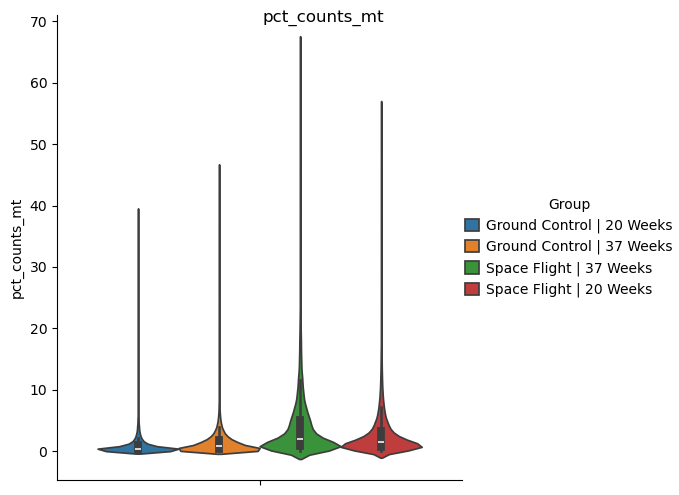

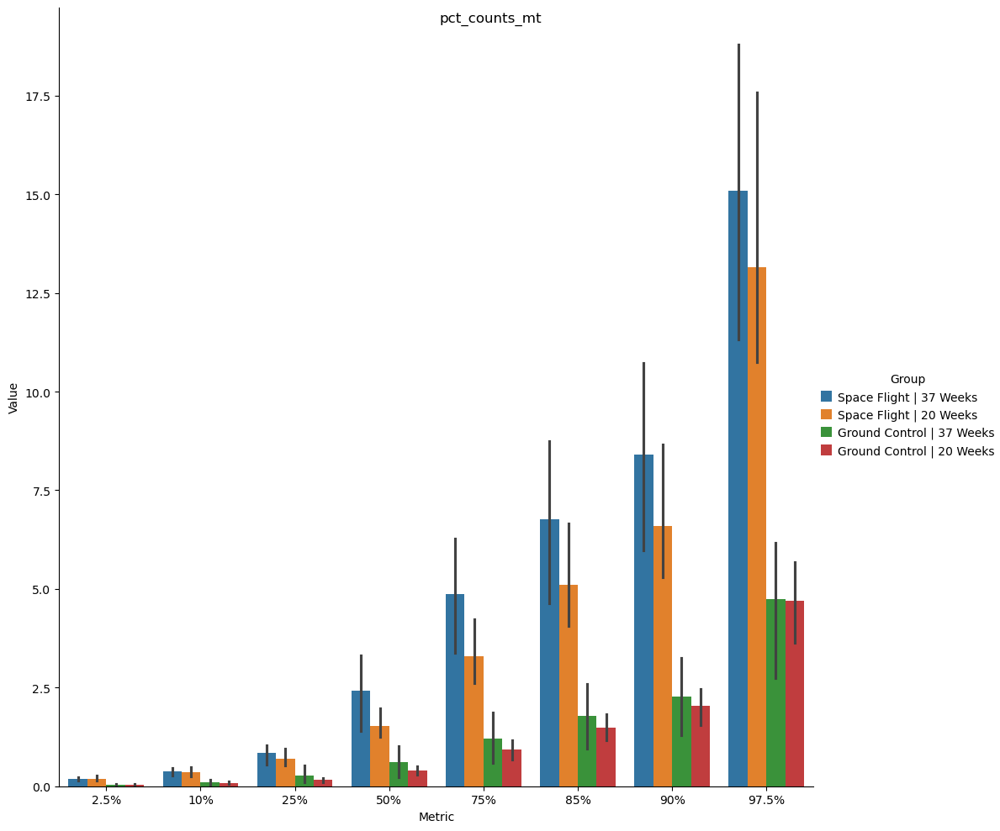

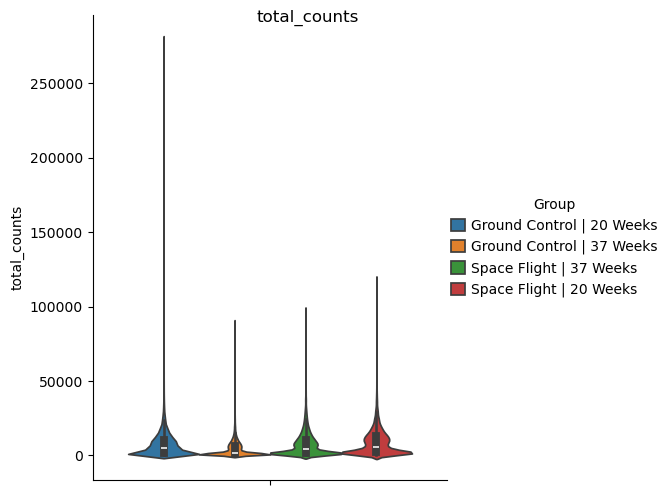

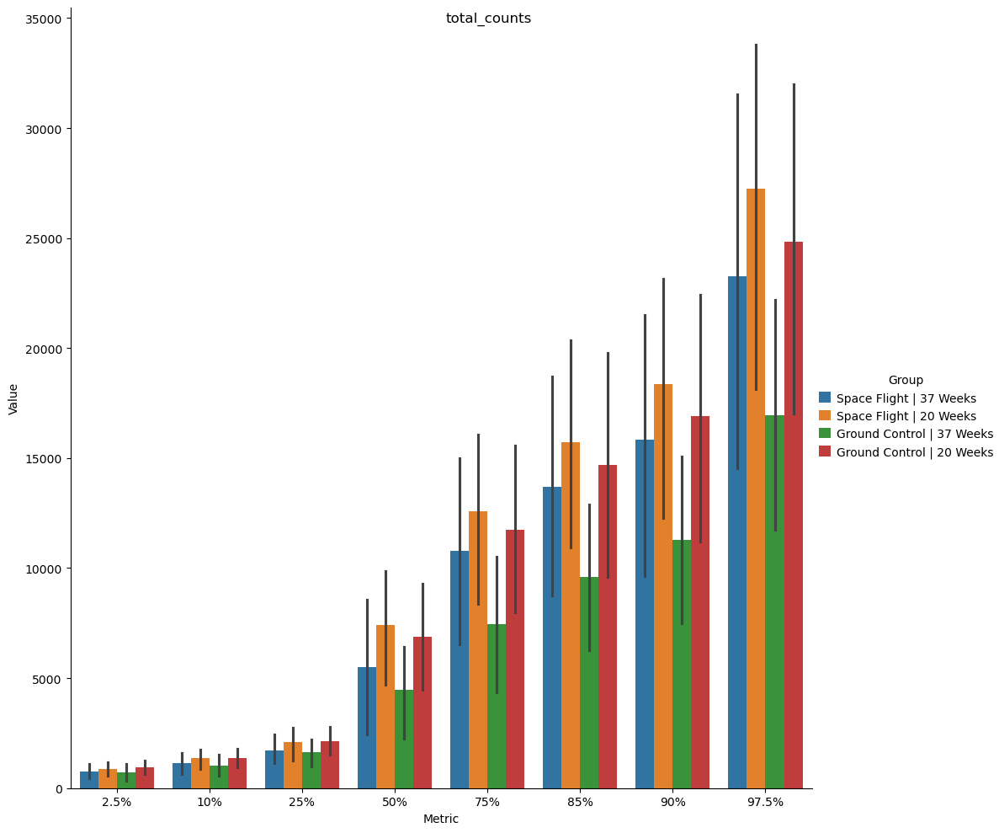

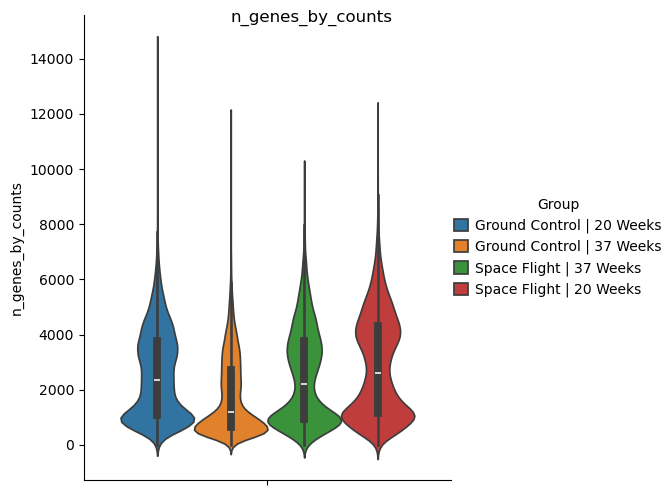

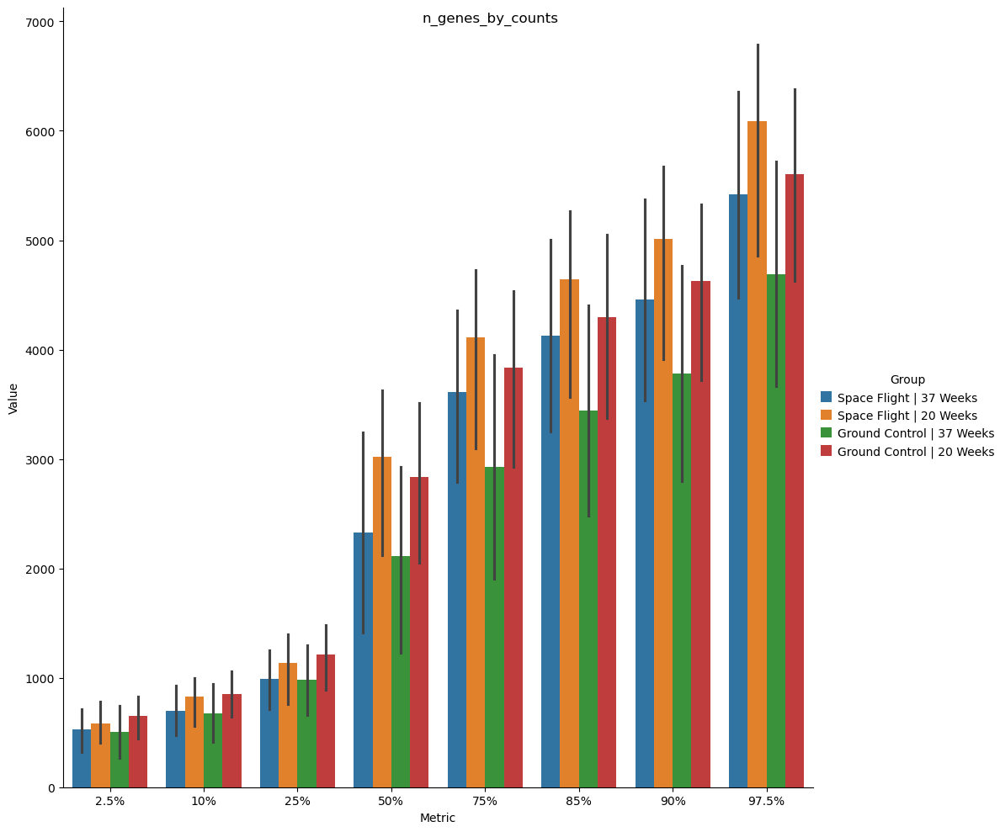

In [4]:
%matplotlib inline

plot_qc = False  # change to True to get sample-level QC plots (a bit slow)
qcs, n_cells_by_counts, descriptives, figs = scflow.pp.perform_qc_multi(
    adatas, col_batch=col_batch, col_sample=col_sample, plot=plot_qc,
    percentiles=[0.025, 0.10, 0.25, 0.50, 0.75, 0.85, 0.90, 0.975],
    figsize=(10, 10))  # perform QC on individual samples
for x in qcs:  # iterate QC metrics % plot percentiles by group
    fig = sns.catplot(qcs, y=x, hue=col_batch, kind="violin")
    fig.fig.suptitle(x)
    fig = sns.catplot(descriptives.loc[:, :, x][[
        i for i in descriptives if ("%" in i)]].stack().to_frame("Value"),
                      x="Metric", y="Value", kind="bar",
                      hue=col_batch, height=10)
    fig.fig.suptitle(x)
descriptives.stack().unstack("Variable").round()

## Auto-Detect Filtering Thresholds

Use 2.5th and/& 97.5th percentile (sample-specific) as minimum genes per cell and minimum and maximum total counts (subject to specified absolute minima). Use 97.5th percentile as upper bound for percent mitochondrial count. 

Use an absolute minimum cells per gene.

Also include arguments to run a PCA on individual samples before integrating.

In [5]:
# Options
bounds = descriptives[["2.5%", "97.5%"]].apply(lambda x: list(
    x), axis=1).unstack("Variable")  # list top/bottom 5% (~sample, variable)
abs_min_cells = 20  # regardless of %ile, minimum cells to retain gene
abs_min_genes = 200  # regardless of %ile, minimum genes to retain cell
abs_min_count = 300  # regardless of %ile, minimum counts to retain cell
abs_max_mt = 10  # regardless of %ile, absolute maximum mitochonrial content
n_top_genes = 2000  # number of top genes to count as HVGs

# Set Thresholds
kws_pp = {}
for x in adatas:
    b_x = bounds.loc[x]
    b_counts =  b_x["total_counts"] if isinstance(b_x[
            "total_counts"], list) else b_x["total_counts"].iloc[0]
    b_counts = [max(b_counts[0], abs_min_count), b_counts[1]]
    kws_pp[x] = {
        "min_max_genes": [max((b_x["n_genes_by_counts"] if isinstance(
            b_x["n_genes_by_counts"], list) else b_x[
                "n_genes_by_counts"].iloc[0])[0], abs_min_genes), None],
        "min_max_cells": [abs_min_cells, None],
        # "min_max_cells": [max((b_x["n_cells_by_counts"] if isinstance(
        #     b_x["n_genes_by_counts"], list) else b_x[
        #         "n_genes_by_counts"].iloc[0])[0], abs_min_cells), None],
        # "max_mt": min(abs_max_mt, (b_x["pct_counts_mt"] if isinstance(b_x[
        #     "pct_counts_mt"], list) else b_x["pct_counts_mt"].iloc[0])[1]),
        "max_mt": abs_max_mt,
        "min_max_counts": b_counts,
        # "vars_regress_out": ["total_counts"],
        "target_sum": 1e4,
        "zero_center": True, "max_value": 10,  # scaling
        "n_top_genes": n_top_genes,
        "doublet_detection": "drop"
    }
print("\n".join([f"{s}: {kws_pp[s]}" for s in kws_pp]))
pd.DataFrame(kws_pp).T

RRRM2_BRN_GC_ISS-T_YNG_GY4: {'min_max_genes': [321.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [414.0, 11122.175000000005], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
RRRM2_BRN_GC_ISS-T_YNG_GY9: {'min_max_genes': [703.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [1006.1500000000001, 23784.40000000001], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
RRRM2_BRN_GC_ISS-T_OLD_GO18: {'min_max_genes': [326.1, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [422.1, 13468.399999999998], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
RRRM2_BRN_FLT_ISS-T_OLD_FO20: {'min_max_genes': [628.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [895.0, 19711.0], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10

,min_max_genes,min_max_cells,max_mt,min_max_counts,target_sum,zero_center,max_value,n_top_genes,doublet_detection
RRRM2_BRN_GC_ISS-T_YNG_GY4,"[321.0, None]","[20, None]",10,"[414.0, 11122.175000000005]",10000.0,True,10,2000,drop
RRRM2_BRN_GC_ISS-T_YNG_GY9,"[703.0, None]","[20, None]",10,"[1006.1500000000001, 23784.40000000001]",10000.0,True,10,2000,drop
RRRM2_BRN_GC_ISS-T_OLD_GO18,"[326.1, None]","[20, None]",10,"[422.1, 13468.399999999998]",10000.0,True,10,2000,drop
RRRM2_BRN_FLT_ISS-T_OLD_FO20,"[628.0, None]","[20, None]",10,"[895.0, 19711.0]",10000.0,True,10,2000,drop
RRRM2_BRN_GC_ISS-T_OLD_GO19,"[666.0, None]","[20, None]",10,"[942.0, 21190.0]",10000.0,True,10,2000,drop
RRRM2_BRN_GC_ISS-T_OLD_GO13,"[822.975, None]","[20, None]",10,"[1282.925, 23156.550000000007]",10000.0,True,10,2000,drop
RRRM2_BRN_FLT_ISS-T_YNG_FY8,"[481.425, None]","[20, None]",10,"[681.7, 27907.149999999994]",10000.0,True,10,2000,drop
RRRM2_BRN_FLT_ISS-T_YNG_FY7,"[331.925, None]","[20, None]",10,"[452.77500000000003, 13453.3]",10000.0,True,10,2000,drop
RRRM2_BRN_FLT_ISS-T_OLD_FO19,"[200, None]","[20, None]",10,"[300, 14724.999999999998]",10000.0,True,10,2000,drop
RRRM2_BRN_GC_ISS-T_YNG_GY7,"[798.75, None]","[20, None]",10,"[1176.375, 28050.25]",10000.0,True,10,2000,drop


# Integrate

## In-Memory Approach

See the "On-Disk Approach" for a more sophisticated approach to defining `kws_integrate` (more options).

In [6]:
# %%time

# # Integrate
# join_method = "outer"  # or "inner"
# kws_integrate = {"kws_pp": kws_pp, "n_top_genes": 10000,
#                  "fill_value": np.nan,
#                  "col_batch": None,  # suppress using batch as covariate
#                  "join": join_method, "merge": "unique", "use_rapids": True}
# self = scflow.Rna(adatas, col_sample=col_sample, col_batch=col_batch,
#                   kws_integrate=kws_integrate)
# self.rna.obs = self.rna.obs.assign(kws_integrate=str(kws_integrate))

# # Write Files for Processed/Integrated Objects?
# if overwrite is True or not os.path.exists(file_new):
#     os.makedirs("data", exist_ok=True)
#     self.rna.write_h5ad(file_new)
# for x in adatas:
#     pfp = os.path.join("data", f"{x}_processed.h5ad")
#     if overwrite is True or not os.path.exists(pfp):
#         adatas[x].write_h5ad(pfp)
# del adatas  # to save memory; now integrated in `self.rna`

# # Display
# print(self.rna)
# # print(self.rna.var.head())
# self.rna.obs

## On-Disk Approach

### Preprocess Individual

#### Filter & Normalize

In [7]:
# Preprocess
if overwrite is False and os.path.exists(pfp):
    raise ValueError("Must be able to overwrite to use on-disk option")
files_individual = dict(zip(files.keys(), [os.path.join(
    "data", f"{x}_processed.h5ad") for x in files]))  # new individual files
var_names = []  # to store genes not filtered out for each sample
for x in files:  # iterate sample files
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}")
    adatas[x].obs.loc[:, f"kws_pp_{col_sample}"] = str(kws_pp[x])  # store kws
    adatas[x] = scflow.pp.preprocess(
        adatas[x], **kws_pp[x], plot_qc=False)  # preprocess data
    var_names += [set(adatas[x].var_names)]  # track what genes still present

# Decide Join Method
shared_genes = set.intersection(*var_names)  # genes in all after filtering
all_genes = set.union(*var_names)  # genes in any post-filter sample
print(f"{len(shared_genes)} genes present in all samples post-filtering (out"
      f" of {len(all_genes)} total genes present in any post-filter sample)")
join_method = "inner" if len(shared_genes) / len(all_genes) >= 0.5 else \
    "outer"  # outer join if <1/2 of genes shared across all samples



RRRM2_BRN_GC_ISS-T_YNG_GY4
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 8542 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.15
Detected doublet rate = 5.9%
Estimated detectable doublet fraction = 60.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.8%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_YNG_GY9
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 6044 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteri

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.19
Detected doublet rate = 4.0%
Estimated detectable doublet fraction = 55.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 7.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_OLD_GO18
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 6503 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.16
Detected doublet rate = 4.8%
Estimated detectable doublet fraction = 55.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 8.5%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_OLD_FO20
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 5641 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characte

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.20
Detected doublet rate = 2.8%
Estimated detectable doublet fraction = 54.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_OLD_GO19
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 8476 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.15
Detected doublet rate = 5.6%
Estimated detectable doublet fraction = 66.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 8.5%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_OLD_GO13
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 3880 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.22
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 52.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.0%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_YNG_FY8
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 5658 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.2%
Estimated detectable doublet fraction = 56.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.7%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_YNG_FY7
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4238 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.14
Detected doublet rate = 5.8%
Estimated detectable doublet fraction = 59.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.7%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_OLD_FO19
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 7265 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characte

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.24
Detected doublet rate = 2.3%
Estimated detectable doublet fraction = 28.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 8.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_YNG_GY7
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 5776 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteri

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.5%
Estimated detectable doublet fraction = 55.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 6.4%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_OLD_FO14
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4260 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characte

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.22
Detected doublet rate = 1.8%
Estimated detectable doublet fraction = 47.7%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 3.8%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_YNG_GY1
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 3968 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteri

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 2.1%
Estimated detectable doublet fraction = 43.2%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.9%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_YNG_FY2
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4125 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 1.9%
Estimated detectable doublet fraction = 46.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.0%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_OLD_FO17
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 1493 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characte

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.20
Detected doublet rate = 2.9%
Estimated detectable doublet fraction = 30.6%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.4%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_OLD_GO16
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 20000 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characte

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.43
Detected doublet rate = 0.3%
Estimated detectable doublet fraction = 7.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 4.2%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_OLD_FO16
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4863 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.21
Detected doublet rate = 2.3%
Estimated detectable doublet fraction = 43.5%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.3%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_GC_ISS-T_YNG_GY2
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 10779 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.17
Detected doublet rate = 5.1%
Estimated detectable doublet fraction = 50.9%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 9.9%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...


RRRM2_BRN_FLT_ISS-T_YNG_FY5
	***Activating layer 'counts'...
AnnData object with n_obs × n_vars = 4714 × 56748
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Character

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/cuml/internals/api_decorators.py:216: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ret = func(*args, **kwargs)


Automatically set threshold at doublet score = 0.18
Detected doublet rate = 3.1%
Estimated detectable doublet fraction = 54.1%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 5.7%
	***Normalizing...
	***Detecting highly variable genes...
	***Scaling data...
12209 genes present in all samples post-filtering (out of 23329 total genes present in any post-filter sample)


#### Test Preprocessing

Unit tests

In [8]:
for p, ann in zip([kws_pp[x] for x in kws_pp], [adatas[x] for x in adatas]):
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}\n")
    if join_method == "inner":
        assert all(ann.var["n_cells_by_counts"] >= p["min_max_cells"][0])
        assert all(ann.var["n_cells_by_counts"] <= p[
            x]["min_max_cells"][1]) if kws_pp[x]["min_max_cells"][1] else True
    assert all(ann.obs["n_genes_by_counts"] >= p["min_max_genes"][0])
    assert all(ann.obs["n_genes_by_counts"] <= p[
        "min_max_genes"][1]) if p["min_max_genes"][1] else True
    assert all(ann.obs["pct_counts_mt"] <= p["max_mt"])
    assert all(ann.obs["total_counts"] >= p["min_max_counts"][0])
    assert all(ann.obs["total_counts"] <= p["min_max_counts"][1]) if (
        p["min_max_counts"][1]) else True
    print(p)
    print(ann.obs[["n_genes", "pct_counts_mt", "total_counts"]
                  ].describe().loc[["min", "max"]])
    print(ann.var[["n_cells_by_counts"]].describe().loc[[
        "min", "max"]])



RRRM2_BRN_FLT_ISS-T_YNG_FY5

{'min_max_genes': [321.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [414.0, 11122.175000000005], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
     n_genes  pct_counts_mt  total_counts
min    321.0            0.0         414.0
max   3977.0           10.0       11089.0
     n_cells_by_counts
min               20.0
max             8521.0


RRRM2_BRN_FLT_ISS-T_YNG_FY5

{'min_max_genes': [703.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [1006.1500000000001, 23784.40000000001], 'target_sum': 10000.0, 'zero_center': True, 'max_value': 10, 'n_top_genes': 2000, 'doublet_detection': 'drop'}
     n_genes  pct_counts_mt  total_counts
min    703.0       0.000000        1009.0
max   6344.0       9.886587       23740.0
     n_cells_by_counts
min               20.0
max             6028.0


RRRM2_BRN_FLT_ISS-T_YNG_FY5

{'min_max_genes': [326.1, None], 'min

### Cluster Individual

#### *A Priori* Clustering Parameters

In [9]:
# %%time

# # Clustering Parameter Options (Only Applied If `kws_cluster` != None)
# resolution_individual, min_dist_individual = 0.15, 1.5
# col_cluster_individual = "annotation_by_markers_individual"
# unlabeled_cat = "Heterogeneous"  # if can't find one best-fit cell label
# cci_scanvi = col_cluster_individual + "_heterogeneous_collapsed"
# sep = " | "  # separator for heterogeneous annotations

# # Preprocessing & (Optionally) Clustering
# if overwrite is False and os.path.exists(pfp):
#     raise ValueError("Must be able to overwrite to use on-disk option")
# # del adatas
# for x in files:  # iterate sample files
#     if kws_cluster is not None:  # cluster individual sample?
#         kws_cl = {"resolution": resolution_individual[x],
#                   "min_dist": min_dist_individual[x], **kws_cluster}
#         self.rna.obs.loc[:, "kws_cluster_individual"] = str(kws_cl)
#         adatas[x] = scflow.pp.cluster(
#             adatas[x], resolution=resolution_individual,
#             min_dist=min_dist_individual, plot=False,
#             col_celltype="leiden_individual", **kws_cl)  # cluster
#         sc.tl.rank_genes_groups(
#             adatas[x], "leiden_individual", n_genes=None, rankby_abs=False,
#             key_added="rank_genes_groups_leiden_individual",
#             copy=False)  # find markers/DEGs
#         if markers_predefined is not None:  # markers specified?
#             _, adatas[x] = scflow.pp.annotate_by_marker_overlap(
#                 adatas[x], markers_predefined,
#                 col_celltype="leiden_individual",
#                 col_celltype_new=col_cluster_individual, sep=sep,
#                 celltypes_superhierarchical=cts_superhierarchical,
#                 # top_n_markers=20,
#                 adj_pval_threshold=1e-10,
#                 method="overlap_coef", inplace=True)  # annotate by markers
#             if rename_marker_based_annotation is not None:
#                 adatas[x].obs.loc[:, col_cluster_individual] = adatas[
#                     x].obs[col_cluster_individual].replace(
#                         rename_marker_based_annotation)  # re-name
#             adatas[x].obs.loc[:, cci_scanvi] = adatas[x].obs[
#                 col_cluster_individual].apply(lambda x: unlabeled_cat if (
#                     sep in x) else x)  # re-label heterogeneous annotations
#     var_names += [set(adatas[x].var_names)]  # track what genes still there

# # Write Objects
# for x in adatas:
#     print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}\n\n{adatas[x]}\n")
#     adatas[x].write_h5ad(files_individual[x])  # write individual file

# # Plot
# if kws_cluster is not None:
#     for x in files:  # iterate sample files
#         ccs = [v for v in ["leiden_individual", col_cluster_individual
#                            ] if v in adatas[x].obs]  # columns for UMAP
#         print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}")
#         sc.pl.umap(adatas[x], color=ccs, wspace=0.4)  # plot UMAP
# del adatas  # save memory

#### Optimize Hyperparameters

Iterate different clustering parameters to ensure extraction of common cell types

Make sample-specific alterations to one sample's annotation



RRRM2_BRN_GC_ISS-T_YNG_GY4
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1.5...
	***Performing Leiden clustering with resolution 0.2...


2025-08-27 19:42:10 | [INFO] init


['Neuron', 'Oligodendrocyte', 'Microglial', 'OPC', 'Endothelial', 'Astrocyte']
{'resolution': 0.2, 'min_dist': 1.5, 'n_comps': 50}


RRRM2_BRN_GC_ISS-T_YNG_GY9
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1.5...
	***Performing Leiden clustering with resolution 0.2...
['Neuron', 'Microglial', 'Astrocyte', 'Oligodendrocyte', 'OPC', 'Endothelial']
{'resolution': 0.2, 'min_dist': 1.5, 'n_comps': 50}


RRRM2_BRN_GC_ISS-T_OLD_GO18
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1.5...
	***Performing Leiden clustering with resolution 0.2...
['Neuron', 'Oligodendrocyte', 'Astrocyte', 'Microglial', 'Endothelial', 'OPC']
{'resolution': 0.2, 'min_dist': 1.5, 'n_comps': 50}


RRRM2_BRN_FLT_ISS-T_OLD_FO20
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1.5...
	***Performing Leiden clustering with resolution

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:456: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: Perf

['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 0.75...
	***Performing Leiden clustering with resolution 0.5...


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:456: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: Perf

['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 0.5...
	***Performing Leiden clustering with resolution 0.5...


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:456: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: Perf

['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1...
	***Performing Leiden clustering with resolution 0.5...


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:456: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: Perf

['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 0.3...
	***Performing Leiden clustering with resolution 0.5...


/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:456: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: Perf

['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1.5...
	***Performing Leiden clustering with resolution 0.1...
['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 0.75...
	***Performing Leiden clustering with resolution 0.1...
['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 0.5...
	***Performing Leiden clustering with resolution 0.1...
['Oligodendrocyte', 'Oligodendrocyte | Microglial', 'Neuron', 'Endothelial', 'Astrocyte', 'Microglial', 'OPC']
	***Calculating PCA with 50 co

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:456: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:458: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/scanpy/tools/_rank_genes_groups.py:461: Perf

['Astrocyte', 'Microglial', 'Neuron', 'OPC', 'Oligodendrocyte', 'Endothelial']
{'resolution': 0.2, 'min_dist': 1.5, 'n_comps': 50}


RRRM2_BRN_FLT_ISS-T_YNG_FY5
	***Calculating PCA with 50 components...
	***Building neighborhood...
	***Embedding UMAP with minimum distance 1.5...
	***Performing Leiden clustering with resolution 0.2...
['Neuron', 'Oligodendrocyte', 'Astrocyte', 'OPC', 'Microglial', 'Endothelial']
{'resolution': 0.2, 'min_dist': 1.5, 'n_comps': 50}
No Valid Clustering Scheme Yet: []


RRRM2_BRN_GC_ISS-T_YNG_GY4

AnnData object with n_obs × n_vars = 7547 × 19356
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source 

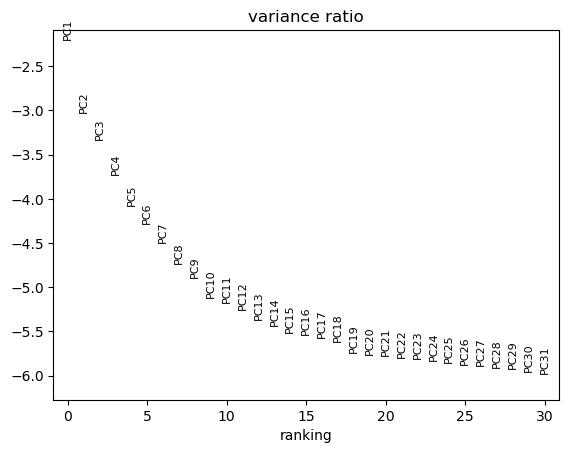

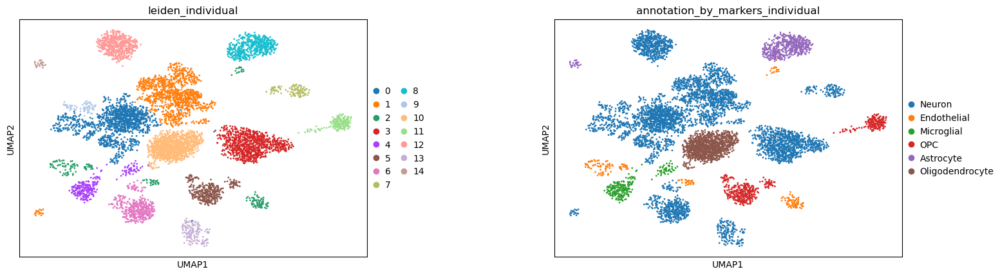

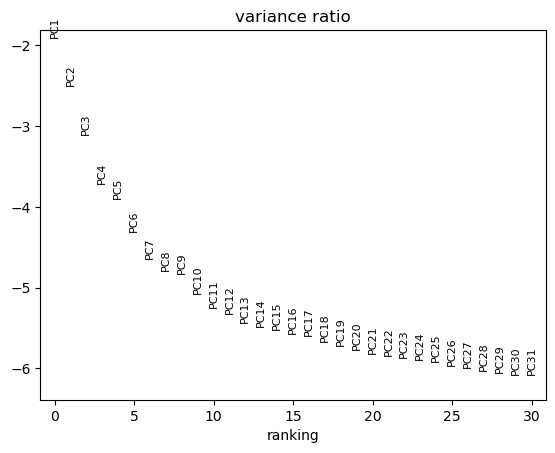

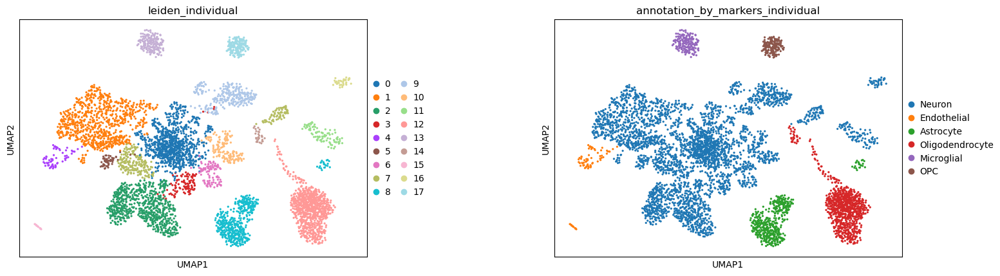

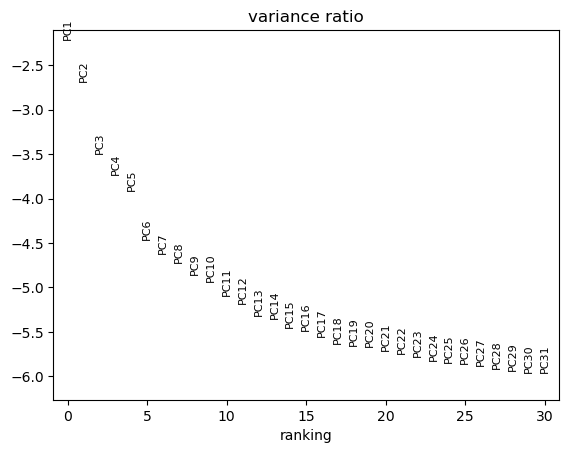

...

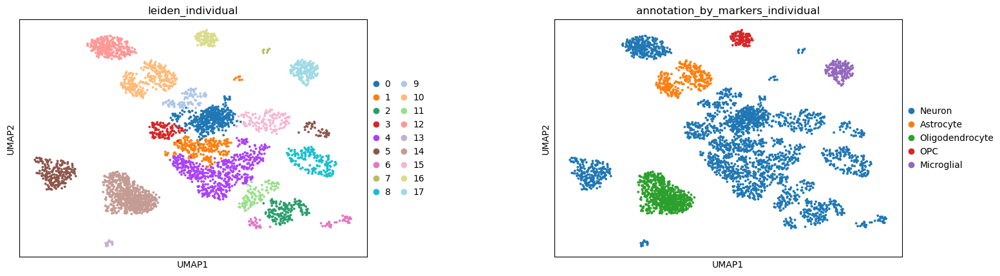

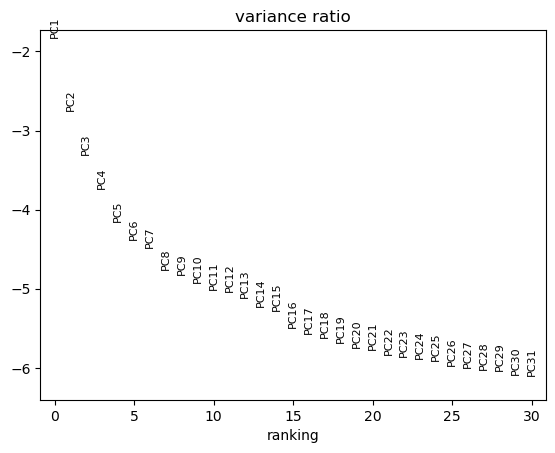

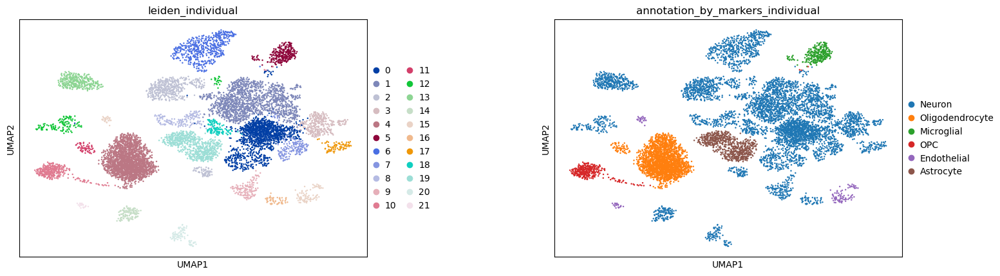

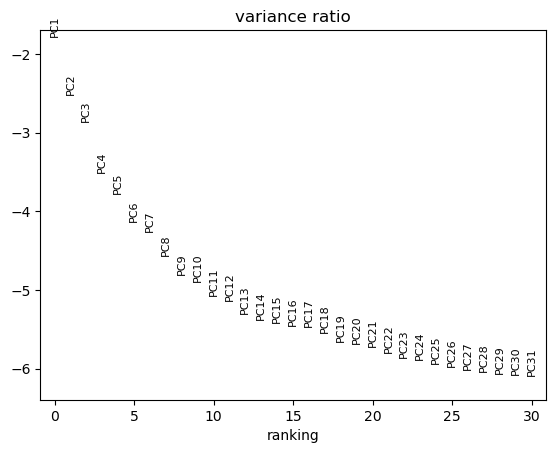

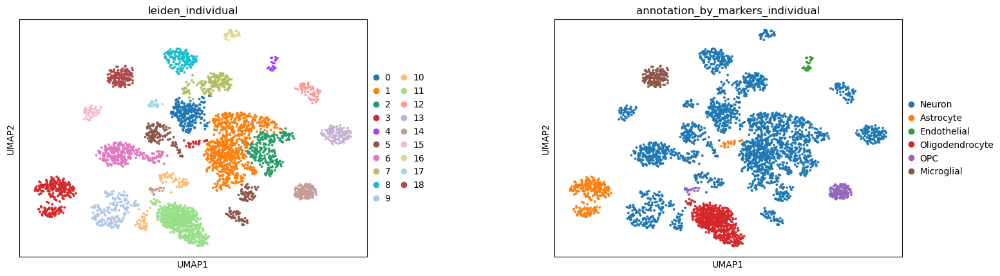

In [10]:
# Clustering Parameter Options (Only Applied If `kws_cluster` != None)
req_cts = ["Neuron", "OPC", "Oligodendrocyte", "Astrocyte", "Microglial"]
prohib_cts = ["Excitatory-Inhibitory"]
resn_list = [0.2, 0.5, 0.1, 0.075, 0.15]
dist_list = [1.5, 0.75, 0.5, 1, 0.3]
col_cluster_individual = "annotation_by_markers_individual"
unlabeled_cat = "Heterogeneous"  # if can't find one best-fit cell label
cci_scanvi = col_cluster_individual + "_heterogeneous_collapsed"
sep = " | "  # separator for heterogeneous annotations

# Clustering
for x in files:  # iterate sample files
    valid_cts = False
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}")
    for r in resn_list:
        if valid_cts is True:
            break
        for t in dist_list:
            if valid_cts is True:
                break
            c_i = f"leiden_individual_res{r}dist{t}"
            cai = f"{col_cluster_individual}_res{r}dist{t}"
            kws_cl = {"resolution": r, "min_dist": t, **kws_cluster}
            adatas[x] = scflow.pp.cluster(
                adatas[x], plot=False, col_celltype=c_i, **kws_cl)
            sc.tl.rank_genes_groups(
                adatas[x], c_i, n_genes=None,
                key_added=f"rank_genes_groups_{c_i}",
                copy=False)  # find markers/DEGs
            _, adatas[x] = scflow.pp.annotate_by_marker_overlap(
                adatas[x], mks_collapsed,
                col_celltype=c_i, col_celltype_new=cai, sep=sep,
                celltypes_superhierarchical=cts_superhierarchical,
                # top_n_markers=20,
                adj_pval_threshold=1e-15,
                method="overlap_count", inplace=True)  # annotate
            if rename_marker_based_annotation is not None:
                adatas[x].obs.loc[:, cai] = adatas[x].obs[cai].replace(
                        rename_marker_based_annotation)  # re-name
            print(list(adatas[x].obs[cai].unique()))
            adatas[x].obs.loc[:, cci_scanvi] = adatas[x].obs[
                cai].apply(lambda x: unlabeled_cat if (sep in x) else x)
            valid_cts = all([q in adatas[x].obs[cai].unique()
                             for q in req_cts])
            valid_cts = valid_cts and (all([q not in adatas[x].obs[
                cai].unique() for q in prohib_cts]))
            valid_cts = False if any(adatas[x].obs[
                cci_scanvi] == unlabeled_cat) else valid_cts
            if valid_cts is True:
                adatas[x].obs.loc[:, "leiden_individual"] = adatas[x].obs[c_i]
                adatas[x].obs.loc[:, col_cluster_individual] = adatas[
                    x].obs[cai]
                adatas[x].obs.loc[:, "kws_cluster_individual"] = str(kws_cl)
                print(kws_cl)

# Detect Samples with No Valid Clustering Scheme
no_valid = []
for x in files:
    if all((i in adatas[x].obs for i in [
            "leiden_individual", col_cluster_individual])) is False:
        print(f"No valid clustering found for {x}")
        no_valid += [x]
print(f"No Valid Clustering Scheme Yet: {no_valid}")

# # Individual Tweak
# samp = "RRRM2_BRN_GC_ISS-T_YNG_GY4"
# cols_tries = [i for i in adatas[samp].obs if "leiden_" in i]
# cts_try = cols_tries[14]
# _, adatas[samp] = scflow.pp.annotate_by_marker_overlap(
#     adatas[samp], mks_collapsed, col_celltype=cts_try,
#     col_celltype_new=col_cluster_individual + "_new", sep=sep,
#     adj_pval_threshold=1e-5,
#     method="overlap_coef", inplace=True)  # annotate by markers
# adatas[samp].obs.loc[:, "leiden_individual"] = adatas[samp].obs[cts_try]
# adatas[samp].obs.loc[:, col_cluster_individual] = adatas[samp].obs[
#     col_cluster_individual + "_new"]
# adatas[samp].obs["kws_cluster_individual"] = str({"resolution": float(
#     cts_try.split("res")[1].split("dist")[0]), "min_dist": float(
#         cts_try.split("res")[1].split("dist")[1])})

# Write Objects
for x in adatas:
    print(f"\n\n{'=' * 80}\n{x}\n{'=' * 80}\n\n{adatas[x]}\n")
    adatas[x].write_h5ad(files_individual[x])  # write individual file

# Print Parameters Used
for x in adatas:
    print(adatas[x].obs["kws_cluster_individual"])

# Plot
for x in adatas:
    sc.pl.pca_variance_ratio(adatas[x], log=True)
    sc.pl.umap(adatas[x], color=[
        "leiden_individual", col_cluster_individual], wspace=0.4)
del adatas

### Concatenate & Integrate

If you are concerned about hard drive space, you may want to delete `file_concat` and `files_individual` after running this cell.


>>>Concatenating data...

>>>Re-Normalizing & Finding HVGs for Overall Data...


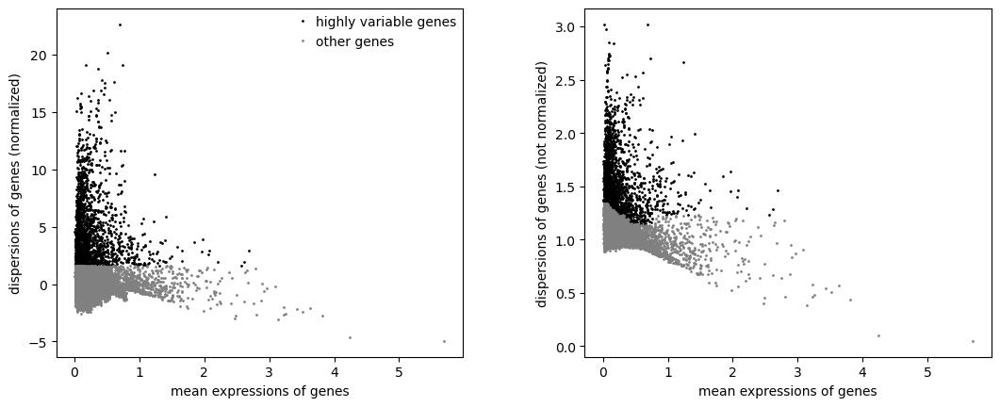


>>>Subsetting to top 2000 HVGs...

>>>Integrating with respect to sample (SCANVI)...


INFO: GPU available: True (cuda), used: True
2025-08-27 19:44:29 | [INFO] GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
2025-08-27 19:44:29 | [INFO] TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
2025-08-27 19:44:29 | [INFO] HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
2025-08-27 19:44:29 | [INFO] LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


	***Using counts layer for scanvi...
	***Using None, None as covariates...
	***Setting up scVI model: {'n_latent': 40, 'n_hidden': 400}...
	***Traning scVI: {'max_epochs': 100, 'accelerator': 'gpu', 'batch_size': 1024, 'early_stopping': True}...


Training:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-08-27 19:45:23 | [INFO] `Trainer.fit` stopped: `max_epochs=100` reached.


	***Setting up scANVI model: {'n_latent': 40, 'n_hidden': 400}...
	***Traning scANVI: {'max_epochs': 100, 'accelerator': 'gpu', 'batch_size': 1024, 'early_stopping': True}...
INFO     Training for 100 epochs.                                                                                  


INFO: GPU available: True (cuda), used: True
2025-08-27 19:45:23 | [INFO] GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
2025-08-27 19:45:23 | [INFO] TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
2025-08-27 19:45:23 | [INFO] HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
2025-08-27 19:45:23 | [INFO] LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Training:   0%|          | 0/100 [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
2025-08-27 19:47:28 | [INFO] `Trainer.fit` stopped: `max_epochs=100` reached.


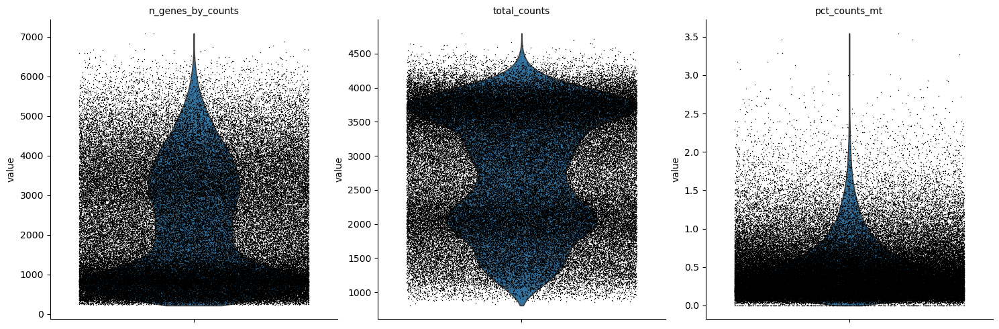

count     12209.000000
mean      18390.727742
std       15953.886715
min         553.000000
25%        6592.000000
50%       12862.000000
75%       25092.000000
max      103242.000000
Name: n_cells_by_counts, dtype: float64


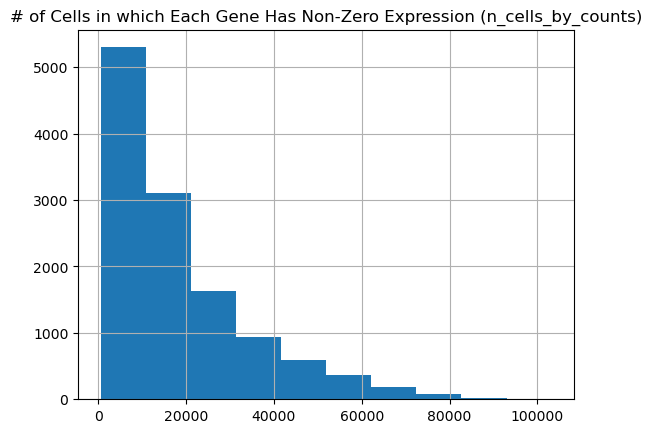

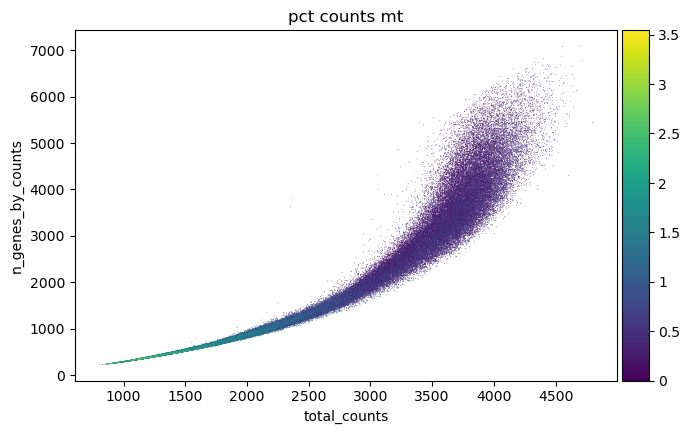

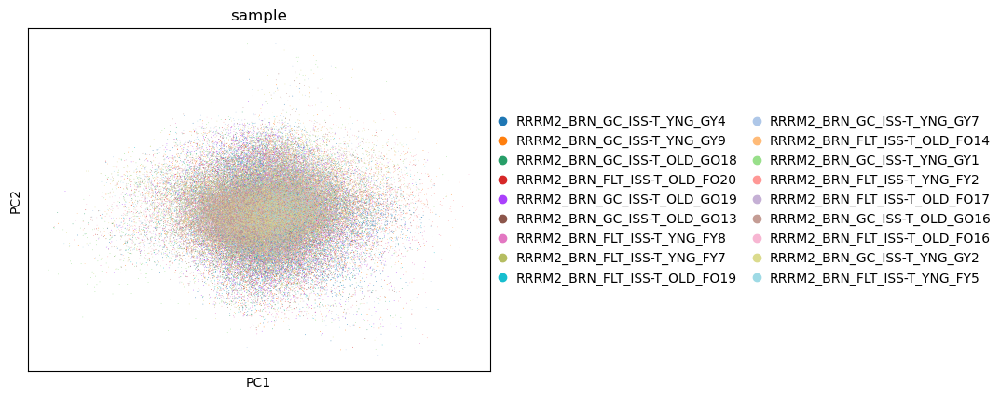

AnnData object with n_obs × n_vars = 103274 × 12209
    obs: 'Group', 'sample', 'Sample Number', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source REF.8', 'Term Accession Number.8', 'Parame

,Group,sample,Sample Number,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Strain],Term Source REF.1,Term Accession Number.1,Characteristics[Genotype],Term Source REF.2,Term Accession Number.2,Characteristics[Animal Source],Characteristics[Sex],Term Source REF.3,Term Accession Number.3,Factor Value[Spaceflight],Term Source REF.4,Term Accession Number.4,Factor Value[Age],Unit,Term Source REF.5,Term Accession Number.5,Characteristics[Material Type],Term Source REF.6,Term Accession Number.6,Characteristics[diet],Characteristics[Feeding Schedule],Characteristics[Age at Euthanasia],Unit.1,Term Source REF.7,Term Accession Number.7,Protocol REF,Parameter Value[habitat],Parameter Value[Enrichment material],Parameter Value[duration],Unit.2,Term Source REF.8,Term Accession Number.8,Parameter Value[light cycle],Protocol REF.1,Parameter Value[Euthanasia Method],Parameter Value[Sample Preservation Method],Term Source REF.9,Term Accession Number.9,Parameter Value[Sample Storage Temperature],Unit.3,Term Source REF.10,Term Accession Number.10,Comment[RFID],Comment[Euthanasia Date],Time,n_cells_original_sample,kws_pp_sample,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt,total_counts_ribo,pct_counts_ribo,log1p_total_counts_ribo,total_counts_hb,pct_counts_hb,log1p_total_counts_hb,n_counts,n_genes,doublet_score,predicted_doublet,leiden_individual_res0.2dist1.5,annotation_by_markers_individual_res0.2dist1.5,annotation_by_markers_individual_heterogeneous_collapsed,leiden_individual,annotation_by_markers_individual,kws_cluster_individual,annotation_scanvi,kws_integrate
AAACAGCCAATCGCAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 20 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,HGC-ISS-04,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Left cerebral hemisphere,FMA,http://purl.org/sig/ont/fma/fma61819,Nutrient Upgraded Rodent Food Bar (NuRFB),ad libitum,20,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Animal Husbandry,Rodent Flight Hardware (Transporter and Habitat),Hut,53,day,UO,http://purl.obolibrary.org/obo/UO_0000033,12 h light/dark cycle,sample collection,"Bilateral thoracotomy with sedation, Cardiac p...",Liquid Nitrogen,NCIT,http://purl.obolibrary.org/obo/NCIT_C68796,-80,degree Celsius,UO,http://purl.obolibrary.org/obo/UO_0000027,6E2A671967,18-Sep-2019,1149.0,8542,"{'min_max_genes': [321.0, None], 'min_max_cell...",2074,2981.067871,7.637716,8.000372,13.387463,0.449083,2.666357,10.547901,0.353830,2.446504,1.628919,0.054642,0.966573,4962.0,2152,0.030852,False,1,Neuron,Neuron,1,Neuron,"{'resolution': 0.2, 'min_dist': 1.5, 'n_comps'...",Neuron,{'col_celltype': 'annotation_by_markers_indivi...
AAACAGCCAGCACCAT-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 20 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,HGC-ISS-04,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON...,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Left cerebral hemisphere,FMA,http://purl.org/sig/ont/fma/fma61819,Nutrient Upgraded Rodent Food Bar (NuRFB),ad libitum,20,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Animal Husbandry,Rodent Flight Hardware (Transporter and Habitat),Hut,53,day,UO,http://purl.obolibrary.org/obo/UO_0000033,12 h light/dark cycle,sample collection,"Bilateral thoracotomy with sedation, Cardiac p...",Liquid Nitrogen,NCIT,http://purl.obolibrary.org/obo/NCIT_C68796,-80,degree Celsius,UO,http://purl.obolibrar

In [11]:
%%time

# Integration Options
cct_available = kws_cluster is not None and (
    markers_predefined is not None)  # individual annotations available?
kws_vi = {"early_stopping": True,
          "batch_size": 1024,  # raise/lower if more/less than 16 GB VRAM
          "max_epochs": 100,
          "accelerator": "gpu",
          "categorical_covariate_keys": covariates_categorical,
          "continuous_covariate_keys": covariates_continuous,
          "n_latent": 40, "n_hidden": 400}  # scVI/scANVI arguments
if covariates_categorical is not None:
    print(metadata[0][covariates_categorical + [
        col_group]].value_counts().unstack(col_group).replace(
            np.nan, 0).astype(int))
kws_integrate = {
    "col_celltype": cci_scanvi if cct_available else None,
    "flavor": "scanvi",
    # "flavor": "scvi",
    # "flavor": "scanorama",
    # "flavor": "harmony",
    "kws_pp": None, "kws_cluster": None,
    "vars_regress_out": vars_regress_out,
    "max_value": 10, "zero_center": True, "target_sum": 1e4,
    "n_top_genes": n_top_genes,
    "join": join_method, "merge": "same",
    "col_batch": None,  # suppress using batch as covariate
    "drop_non_hvgs": True,  # just for the integration part
    "use_rapids": True,
    "fill_value": np.nan if join_method == "outer" else None,
    "out_file": file_concat, **kws_vi
}

# If scVI/scANVI Integration & Individual Annotations Available
if kws_integrate["flavor"] in ["scvi", "scanvi"] and cct_available is True:
    kws_integrate.update({"unlabeled_category": unlabeled_cat})

# Integrate & Store Integration Parameters in Object
self = scflow.Rna(files_individual, col_sample=col_sample,
                  col_batch=col_batch, kws_integrate=kws_integrate)
self.rna.obs = self.rna.obs.assign(kws_integrate=str(kws_integrate))

# Write Files for Processed/Integrated Objects?
if overwrite is True or not os.path.exists(file_new):
    self.rna.write_h5ad(file_new)

# Display
print(self.rna)
self.rna.obs

## Benchmark Integration

In [12]:
# if kws_integrate["flavor"] == "scanvi":
#     try:
#         results_integration_benchmark = scflow.pp.benchmark_integration(
#             self.rna, col_sample, col_celltype="annotation_scanvi")
#     except Exception as err:
#         print(err)

# Clustering

Perform PCA, UMAP embedding, and Leiden clustering on the integrated object

Marker gene-related code looks at top markers by log2fold-change and adjusted p-value cutoffs and sorts by adjusted p-values. Plots for predefined marker expression by cluster (if available) and cluster DEGs are created. Use `kind = ["heat", "dot"]` to get dot plots too.

	***Building neighborhood with 15 neighbors...
	***Embedding UMAP with minimum distance 1.8...
	***Performing Leiden clustering with resolution 0.0075...
        n_cells
leiden         
0         67620
3         18471
2          8011
1          4031
4          3119
5          2022
leiden                            0    1     2     3    4    5
sample                                                        
RRRM2_BRN_GC_ISS-T_YNG_GY4     4157  326  1636  1218  191   19
RRRM2_BRN_GC_ISS-T_YNG_GY9     3647  242   472   907  197    0
RRRM2_BRN_GC_ISS-T_OLD_GO18    4147  225   490   803  177    0
RRRM2_BRN_FLT_ISS-T_OLD_FO20   2819  231   340  1243  173  116
RRRM2_BRN_GC_ISS-T_OLD_GO19    5094  334   492  1364  255    0
RRRM2_BRN_GC_ISS-T_OLD_GO13    1859  143   342   988  133  130
RRRM2_BRN_FLT_ISS-T_YNG_FY8    2940  318   420  1197  219    1
RRRM2_BRN_FLT_ISS-T_YNG_FY7    1866  182   227  1047  127  220
RRRM2_BRN_FLT_ISS-T_OLD_FO19   4357  187   302   761  140    0
RRRM2_BRN_GC_ISS-T_YNG_GY

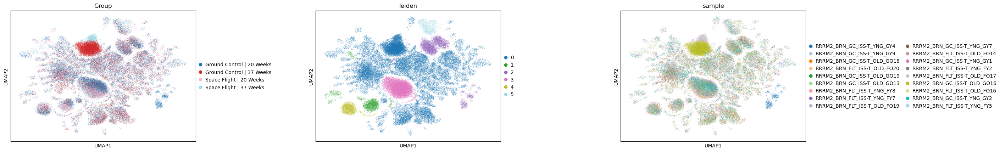

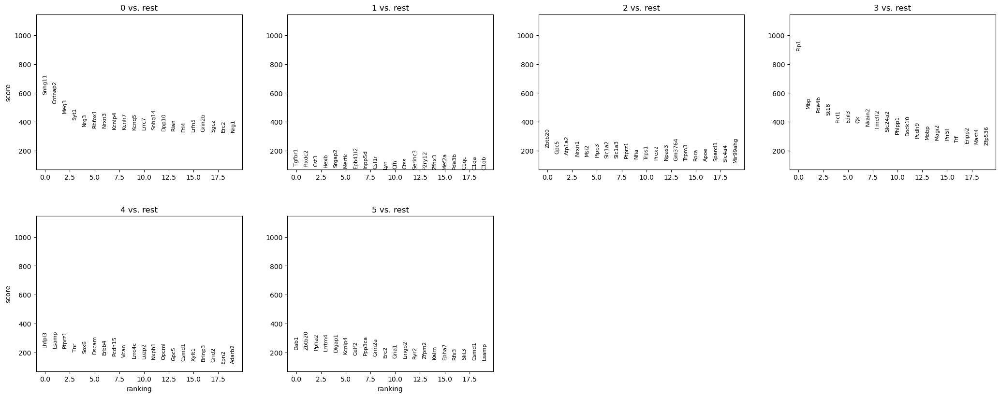

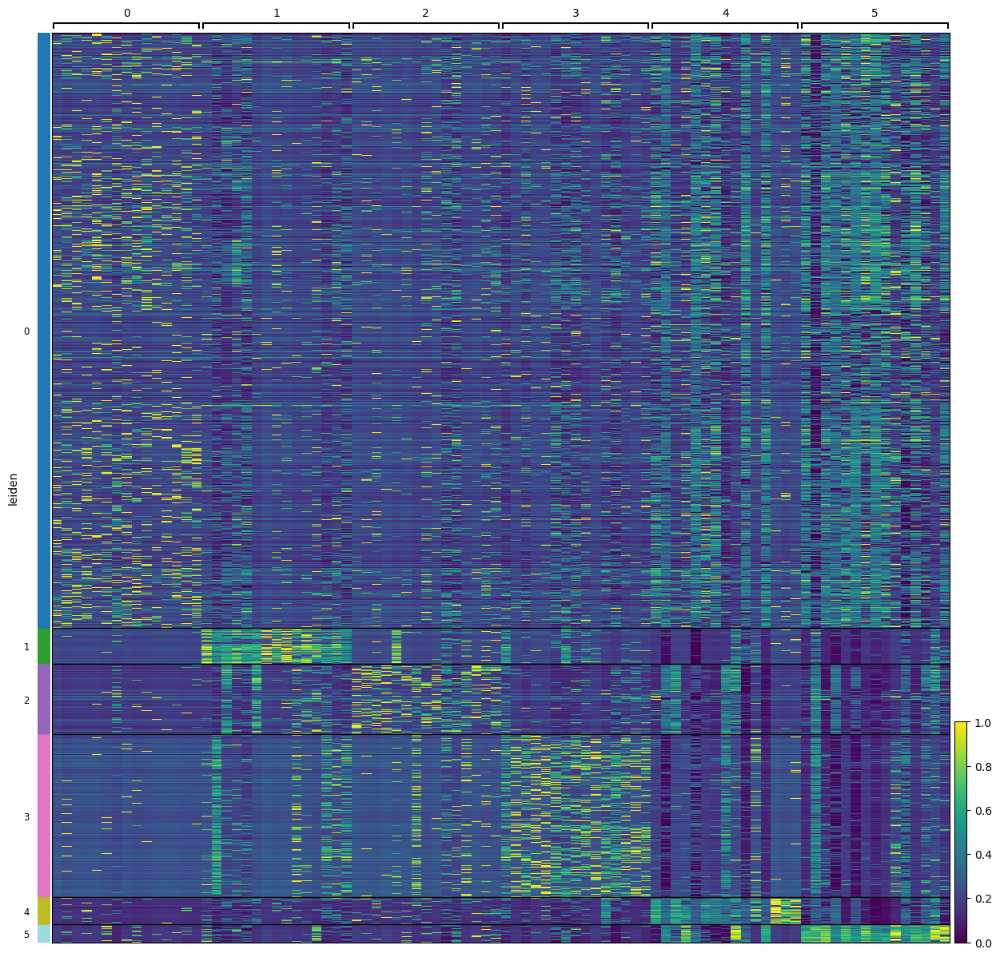

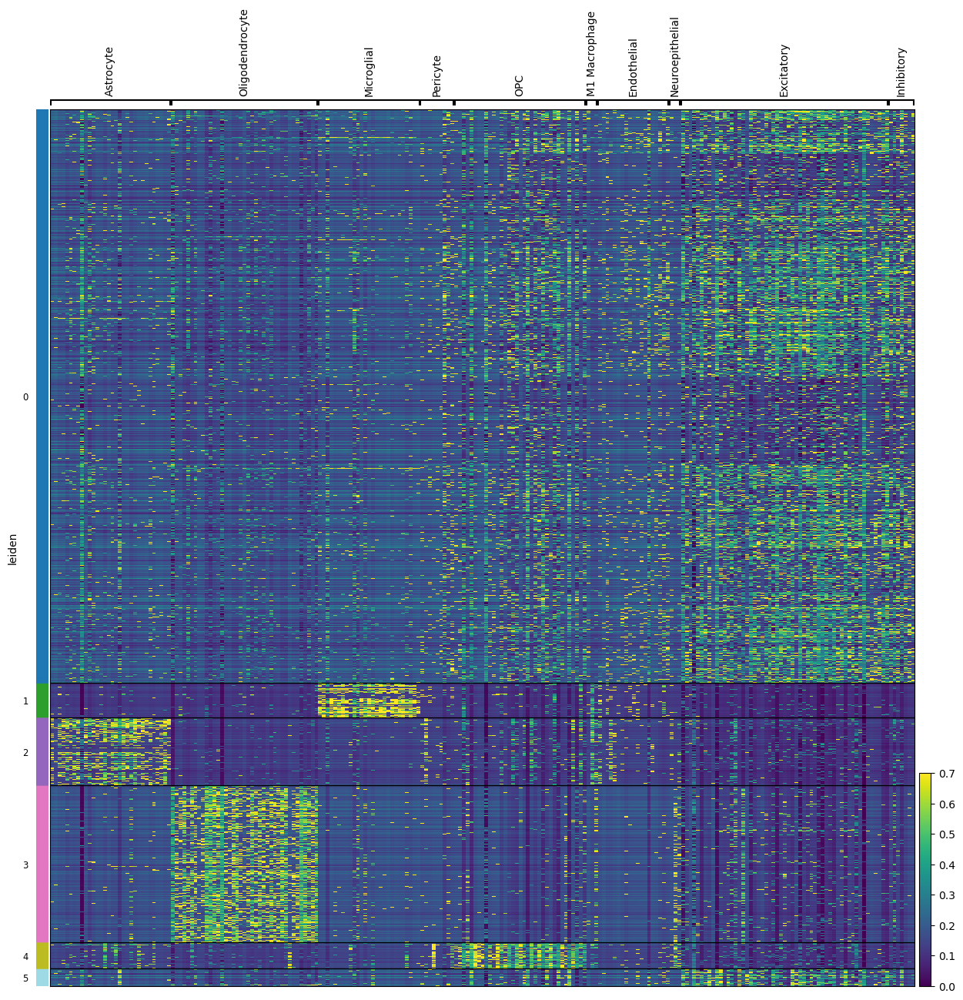

CPU times: user 18.4 s, sys: 2.3 s, total: 20.7 s
Wall time: 10.3 s


scores  logfoldchanges  pvals  pvals_adj
leiden names                                                      
0      D430036J16Rik   61.309509        4.990091    0.0        0.0
       Rnft2           61.510143        1.937376    0.0        0.0
       Slc9a5          61.497097        2.891917    0.0        0.0
       Vstm5           61.495773        2.577633    0.0        0.0
       Neurod6         61.486301        3.206880    0.0        0.0
       Uck2            61.385696        2.036597    0.0        0.0
       Dach1           61.379723        1.523088    0.0        0.0
       Gm7854          61.371799        2.415336    0.0        0.0
       Nptxr           61.325497        1.764102    0.0        0.0
       Nr4a1           61.522820        2.076881    0.0        0.0
       Cfap20dc        61.265667        2.978702    0.0        0.0
       Rasgef1c        61.235207        3.449342    0.0        0.0
       Necab3          61.220501        2.939095    0.0        0.0
       Gga2            61.176292        2.068175    0.0        0.0
       Ppp1r1b         61.176071        2.064379    0.0        0.0
3      Tmcc3           63.932625        1.676479    0.0        0.0
       Kif6            62.210667        3.492605    0.0        0.0
       Dpy19l1         62.511562        1.820279    0.0        0.0
       Hhip            62.641945        4.484349    0.0        0.0
       Gm42692         62.959969        4.138031    0.0        0.0
       Plekha1         63.209167        1.630567    0.0        0.0
       Picalm          63.227680        1.551437    0.0        0.0
       Vps8            63.328060        1.767782    0.0        0.0
       Kat2b           63.331123        2.191416    0.0        0.0
       E330020D12Rik   63.460175        4.282972    0.0        0.0
       Sh3d19          63.593933        1.824674    0.0        0.0
       Tmtc2           63.794159        1.581886    0.0        0.0
       Ikzf2           63.885136        2.316349    0.0        0.0
       Tsc22d3         61.872627        2.875392    0.0        0.0
       Nrbp2           64.409531        2.196204    0.0        0.0
1      Tgfbr1          96.269440        6.537854    0.0        0.0
       Plxdc2          92.459023        3.993986    0.0        0.0
       Cst3            90.813576        4.456982    0.0        0.0
       Hexb            86.237549        4.918062    0.0        0.0
       Srgap2          84.980904        3.755916    0.0        0.0
       Mertk           82.558876        5.070720    0.0        0.0
       Gm2629          60.519070        7.736377    0.0        0.0
       Maf             60.278793        4.781848    0.0        0.0
       Entpd1          59.965870        5.646076    0.0        0.0
       Agmo            59.917198        4.336596    0.0        0.0
       Ccnd3           59.413700        4.678184    0.0        0.0
       Rreb1           58.961273        4.047817    0.0        0.0
       Tmcc3           58.775810        3.148770    0.0        0.0
       Ankrd44         58.252613        3.792160    0.0        0.0
       Dleu2           57.932205        2.747823    0.0        0.0
4      Lhfpl3         234.114822        5.471857    0.0        0.0
       Lsamp          231.554016        2.738898    0.0        0.0
       Ptprz1         230.452835        5.598438    0.0        0.0
       Adarb2         126.355278        4.283548    0.0        0.0
       Nlgn1          125.832481        1.752069    0.0        0.0
       Sgcd           123.304092        3.683388    0.0        0.0
       Slc35f1        119.426247        3.308296    0.0        0.0
       Npas3          119.023331        3.223890    0.0        0.0
       Maml2           85.709671        3.749222    0.0        0.0
       Nav3            85.277328        1.984953    0.0        0.0
       Arhgap31        83.992584        4.894548    0.0        0.0
       Lrrtm4          83.335274        2.043919    0.0        0.0
       Cspg4           83.321251        8.408066    0.0        0.0
      

In [33]:
%%time

# Clustering Options
resolution, min_dist = 0.0075, 1.8
# resolution, min_dist = 0.015, 1.5
# resolution, min_dist = 0.022, 1.5
# resolution, min_dist = 0.025, 1
# resolution, min_dist = 0.027, 1.3
# resolution, min_dist = 0.012, 1.5
# resolution, min_dist = 0.027, 1.3
# resolution, min_dist = 0.035, 1.3
# resolution, min_dist = 0.02, 0.6
# resolution, min_dist = 0.018, 0.7
# resolution, min_dist = 0.012, 0.5
# resolution, min_dist = 0.0115, 1.5
# resolution, min_dist = 0.011, 0.5
# n_neighbors = 100
# n_neighbors = 20
n_neighbors = 15
cct = "leiden"  # key added/column name

# Set Default Cell Type Column
col_celltype = cct
self._info["col_celltype"] = col_celltype

# Clustering
self.cluster(col_celltype=cct, resolution=resolution, min_dist=min_dist,
             kws_pca=False, layer="scaled",
             kws_neighbors=dict(n_neighbors=n_neighbors))  # cluster
self.rna.obs = self.rna.obs.assign(**{
       f"{cct}_resolution": resolution}).assign(
              **{f"{cct}_n_neighbors": n_neighbors}).assign(
                     **{f"{cct}_min_dist": min_dist})  # store parameters
_ = self.plot(kind="umap", wspace=0.5, palette="tab20",
              color=[col_batch, "leiden", col_sample])  # plot UMAP
print(self.rna.obs["leiden"].value_counts().to_frame("n_cells"))  # N/cluster
print(self.rna.obs.groupby(col_sample).apply(lambda x: x[
       cct].value_counts(), include_groups=False).unstack(1))  # by group

# DEGs (One Cluster versus All)
self.find_markers(col_celltype=cct)  # DEGs by cluster
markers_df = self.get_markers_df(
    n_genes=15, col_celltype=cct,
    p_threshold=1e-10, log2fc_threshold=1.5, log2fc_threshold_abs=False)
markers_dict = dict(markers_df.groupby(cct).apply(
    lambda x: list(x.reset_index().names)))  # dictionary version of df
_ = self.plot(genes=markers_dict, figsize=(15, 15),
              layer="scaled", standard_scale="obs", kind="heat")
if markers_predefined is not None:
    mks_c = dict(zip(markers_predefined, [markers_predefined[x].intersection(
           self.rna.var_names) for x in markers_predefined]))
    mks_c["Inhibitory"] = mks_c["Inhibitory"].difference(mks_c["Excitatory"])
    mks_c["Excitatory"] = mks_c["Excitatory"].difference(mks_c["Inhibitory"])
    _ = self.plot(genes=mks_c, figsize=(15, 15), vmax=0.7,
                  layer="scaled", standard_scale="obs", kind="heat")
markers_df

# Sub-Clustering

Sub-cluster the biggest <subcluster_biggest> Leiden clusters?

For instance if `subcluster_biggest = 3`, take top three most abundant (highest cell count) clusters and sub-cluster them.

In [34]:
resolution_sub = None if subcluster_biggest is False else 0.005

if subcluster_biggest is not False:

    # Sub-Clustering
    col_celltype = "leiden_subcluster"
    biggest_clusters = self.rna.obs["leiden"].value_counts().index.values[
        :min(len(self.rna.obs["leiden"].unique()), subcluster_biggest)]
    self.rna.obs.loc[:, col_celltype] = self.rna.obs.leiden.copy()
    for x in biggest_clusters:
        sc.tl.leiden(self.rna, restrict_to=(col_celltype, [x]),
                     key_added=col_celltype, resolution=resolution_sub,
                     seed=0, n_iterations=-1, use_weights=True)
    self.find_markers(col_celltype=col_celltype)  # DEGs by cluster
    self.plot(kind="umap", color=col_celltype)
    print(self.rna.obs[[col_sample, col_celltype]].groupby(
        col_sample).value_counts().unstack(1))
    self.rna.obs.loc[:, f"resolution_{col_celltype}"] = resolution_sub
    self._info["col_celltype"] = col_celltype

    # Marker Plots
    if markers_predefined is not None:
        mks_c = dict(zip(markers_predefined, [markers_predefined[
            x].intersection(self.rna.var_names) for x in markers_predefined]))
        _ = self.plot(genes=mks_c, figsize=(15, 15), vmax=0.7,
                      layer="scaled", standard_scale="obs", kind="heat")
    markers_df = self.get_markers_df(
        n_genes=15, col_celltype=cct,
        p_threshold=1e-10, log2fc_threshold=1.5, log2fc_threshold_abs=False)
    markers_dict = dict(markers_df.groupby(cct).apply(
        lambda x: list(x.reset_index().names)))  # dictionary version of df
    _ = self.plot(genes=markers_dict, figsize=(15, 15),
                  layer="scaled", standard_scale="obs", kind="heat")
    print(markers_df)

# Annotate

Annotate cell types with various methods

## Annotate by Marker Gene Overlap

File from https://github.com/nasa/GeneLab_Data_Processing/blob/master/scRNAseq/10X_Chromium_3prime_Data/GeneLab_CellType_GeneMarkers/GL-DPPD-7111_GeneMarker_Files/GL-DPPD-7111_Mmus_Brain_CellType_GeneMarkers.csv

**Example of the Expected Marker Definition Format**
```
markers_predefined = {
    "CD4 T cells": {"IL7R"},
    "CD14+ Monocytes": {"CD14", "LYZ"},
    "B cells": {"MS4A1"},
    "CD8 T cells": {"CD8A"},
    "NK cells": {"GNLY", "NKG7"},
    "FCGR3A+ Monocytes": {"FCGR3A", "MS4A7"},
    "Dendritic Cells": {"FCER1A", "CST3"},
    "Megakaryocytes": {"PPBP"},
}
```

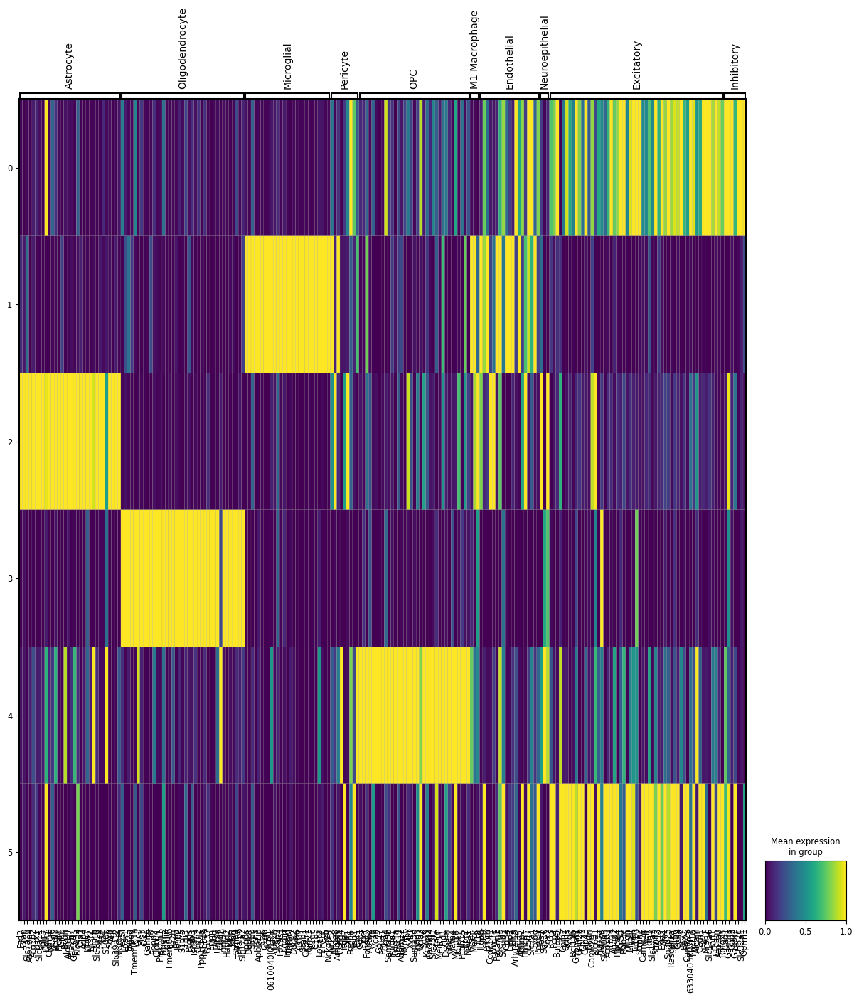

annotation_by_overlap
Neuron             67.43
Oligodendrocyte    17.89
Astrocyte           7.76
Microglial          3.90
OPC                 3.02
Name: proportion, dtype: float64


leiden  annotation_by_overlap
5       Neuron                    1.96
4       OPC                       3.02
1       Microglial                3.90
2       Astrocyte                 7.76
3       Oligodendrocyte          17.89
0       Neuron                   65.48
Name: proportion, dtype: float64

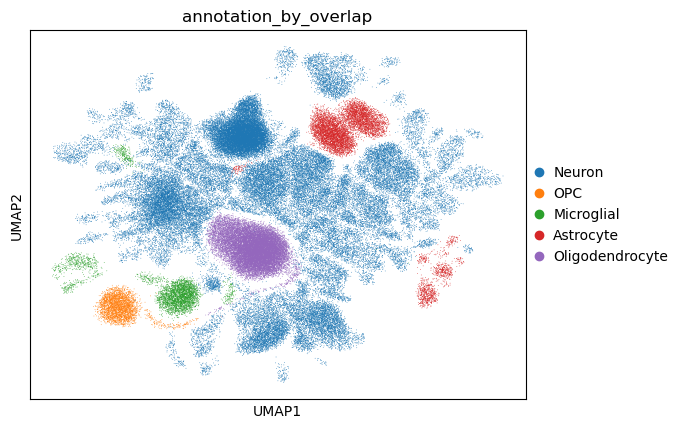

In [35]:
# Plot
_ = self.plot(genes=mks_c, figsize=(15, 15),
              layer="scaled", standard_scale="var", kind="matrix")

# Annotate
marker_matches = self.annotate(
    mks_collapsed,
    # celltypes_superhierarchical=celltypes_superhierarchical,
    col_celltype=col_celltype, col_celltype_new="annotation_by_overlap",
    top_n_markers=50,  # can only have this one or `adj_pval_threshold`
    # adj_pval_threshold=1e-10,
    # method="overlap_count",
    method="overlap_coef",
    # method="jaccard",
    overwrite=True)

# Plot Predefined Marker Expression
# cct = col_celltype
# # cct = "annotation_by_markers_individual"
# mks_col = dict(zip(self.rna.obs[cct].cat.categories, [list(
#     mks_collapsed[x].intersection(self.rna.var_names)
#     ) for x in self.rna.obs[cct].cat.categories]))
# _ = self.plot(genes=mks_col, figsize=(15, 15), col_celltype=cct,
#               layer="scaled", standard_scale="obs", kind="heat")

# Rename Any Labels As Pre-Specified
if rename_marker_based_annotation is not None:
    self.rna.obs.loc[:, "annotation_by_overlap"] = self.rna.obs[
        "annotation_by_overlap"].replace(rename_marker_based_annotation)

# Print & Plot Results
self.plot(kind="umap", color="annotation_by_overlap", wspace=0.4)
print(round(self.rna.obs["annotation_by_overlap"].value_counts(
    normalize=True) * 100, 2))
round(self.rna.obs[[col_celltype, "annotation_by_overlap"]
                   ].value_counts(normalize=True)* 100, 2).sort_values()

## Annotate with ToppGene

In [36]:
# Options
min_genes = 2  # minimum markers that have to overlap between Leiden & atlas
remove_strings = ["----L1-6", # "---[|]M.*",
                  "facs-", "-nan-",
                  # "-i_Gaba_3-.*",
                  "Brain_organoid-organoid_Kanton_Nature-Organoid-..-",
                  # "Non-neuronal-Macroglial-((^|)(Oligo|Astro))+-",
                  # "-Glut_E.*IL7R",
                  "cells hierarchy compared to all cells using T-S.*",
                  ".*-organoid_Tanaka_cellReport-.+-",
                  "...BrainAtlas -.*", "-eN2.*", "...Sample groups.*",
                  "...Sample Type, Dataset.*",
                  "-Neuronal",
                  " // Primary Cells by Cluster",
                  ".World...Primary Cells by Cluster",
                  "Brain_organoid-organoid_Velasco_nature-6_",
                  "Fetal_brain-fetalBrain_Zhong_nature-....-",
                  "Somatosensory_Cortex_....-Neuronal-",
                  "Non-neuronal-Non-dividing-",
                  "...Sample groups..6 Anatomical region groups., with 5.*",
                  "Brain_organoid-organoid_Paulsen_bioRxiv-",
                  "-Glut_E_(THEMIS)", "[(]THEMIS[)]",  # "[|].*",
                  "- method, tissue, subtissue, age, lineage.*"]
drop_name_patterns = ["striatum", "globus", "Entopeduncular",
                      "Substantia_nigra-", "Thalamus-"]
toppgene_rename_by_pattern = dict(
    Inhibitory=["Inh(_|ib)", "GABA"], Excitatory=["Excit", "Glut"],
    # Inhibitory=["Inh(_|ib)"], Excitatory=["Excit"],
    # # Gabaergic=["GABA"], Glutamatergic=["Glut"],
    Astrocyte=["Astrocyte","Astroglia", "Macroglial-Astro"],
    Microglial=["Microglia", "Micro"],
    Endothelial=["Endothelial"],
    Oligodendrocyte=[r"^(?=.*oligo)(?!.*poly)(?!.*opc).*"],
    OPC=["Polydendrocyte", "OPC"])
drop_regions = [
    "Mid-temporal_gyrus_(MTG)", "primary_auditory_cortex_(A1C)",
    "Somatosensory_Cortex_(S1)", "Anterior_Cingulate_gyrus_(CgG)",
    "Primary_Motor_Cortex_(M1)",
    "Mid-temporal_gyrus_(MTG)|Mid-temporal_gyrus_(MTG)",
    "primary_auditory_cortex_(A1C)|primary_auditory_cortex_(A1C)",
    "Somatosensory_Cortex_(S1)|Somatosensory_Cortex_(S1)",
    "Anterior_Cingulate_gyrus_(CgG)|Anterior_Cingulate_gyrus_(CgG)",
    "Primary_Motor_Cortex_(M1)|Primary_Motor_Cortex_(M1)",
    r"Neuronal|World / ",
    "Primary_Visual_cortex_(V1C)|Primary_Visual_cortex_(V1C)",
    "mon",
    "BMP_responsible_cell|6m", "bearing_cell|6m", "bearing_cell|GW16", "11",
    "Non-neuronal-Non-dividing",
    "Frontal_cortex|Frontal_cortex",
    "Primary_Visual_cortex_(V1C)", "Substantia_nigra",
    "Thalamus", "Hippocampus", "Frontal_cortex"
]  # remove if name is just a region or top-level hierarchical/undesired type
drop_regions = drop_regions + [f"{i}-Non-neuronal" for i in drop_regions]

# Query ToppGene
results_toppgene = scflow.pp.annotate_by_toppgene(
    markers_dict, remove_strings=remove_strings,
    species=species, min_genes=min_genes, source_patterns=source_patterns)

# Remove or Alter Certain Name Patterns
drop_names = results_toppgene.Name.apply(lambda x: not any((
    i.lower() in x.lower() for i in drop_name_patterns)))
results_toppgene = results_toppgene[drop_names]
rn_tg = results_toppgene.Name.apply(lambda x: {x: " | ".join([
    j for j in toppgene_rename_by_pattern if any((re.search(i.lower(
        ), x.lower()) is not None for i in toppgene_rename_by_pattern[
            j]))])}).apply(lambda x: np.nan if x[list(x.keys())[
                0]] == "" else x).dropna().reset_index(drop=True).apply(
                    lambda x: pd.Series(x)).stack().reset_index(
                        0, drop=True)  # renaming guide
results_toppgene = results_toppgene.replace({"Name": dict(rn_tg)})
results_toppgene = results_toppgene[~results_toppgene.Name.isin(drop_regions)]

# Map Labels (Plurality Vote If Sufficient or Top)
top_cs = dict(results_toppgene.groupby(
    "Gene Set").apply(lambda x: x.Name.iloc[:10].value_counts().index.values[
        0] if x.Name.iloc[:10].value_counts(
            normalize=True).iloc[0] >= 0.25 else x.Name[0]))
print("\n".join([f"{k}: {top_cs[k]}" for k in top_cs]), "\n\n")
if "annotation_toppgene" in self.rna.obs:
    self.rna.obs = self.rna.obs.drop("annotation_toppgene", axis=1)
self.rna.obs = self.rna.obs.join(self.rna.obs[col_celltype].replace(
    top_cs).to_frame("annotation_toppgene")).loc[self.rna.obs.index]

# Display Results
if "annotation_by_overlap" in self.rna.obs:
    print(round(self.rna.obs[["annotation_toppgene", "annotation_by_overlap"]
                             ].value_counts(normalize=True).sort_index(
                                 ) * 100, 2), "\n\n")
print(round(self.rna.obs["annotation_toppgene"].value_counts(
    normalize=True) * 100, 2))
results_toppgene.reset_index("ID", drop=True).drop([
    "QValueBonferroni", "QValueFDRBY", "QValueFDRBH",
    "TotalGenes", "Genes"], axis=1)

0: Excitatory
1: Microglial
2: Astrocyte
3: Oligodendrocyte
4: OPC
5: Excitatory 


annotation_toppgene  annotation_by_overlap
Excitatory           Neuron                   67.43
Microglial           Microglial                3.90
Astrocyte            Astrocyte                 7.76
Oligodendrocyte      Oligodendrocyte          17.89
OPC                  OPC                       3.02
Name: proportion, dtype: float64 


annotation_toppgene
Excitatory         67.43
Oligodendrocyte    17.89
Astrocyte           7.76
Microglial          3.90
OPC                 3.02
Name: proportion, dtype: float64


Name    PValue GenesInTerm GenesInQuery GenesInTermInQuery                                             Source  \
Gene Set Category                                                                                                                                                               
0        ToppCell                                         Excitatory   0.00001         150           13                  3  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory  0.000011         153           13                  3  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory  0.000017         177           13                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory  0.000017         178           13                  3      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory  0.000019         184           13                  3  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell  Fetal_brain-fetalBrain_Zhong_nature-GW10|fetal...  0.000024         199           13                  3  Integration of Four Brain Organoid Datasets an...   
         ToppCell  Fetal_brain-organoid_Tanaka_cellReport-GW10|or...  0.000024         200           13                  3  Integration of Four Brain Organoid Datasets an...   
         ToppCell                                      Neuronal|GW12   0.00014          61           13                  2  Integration of Four Brain Organoid Datasets an...   
         ToppCell                               Cortical_neuron|GW12  0.000332          94           13                  2  Integration of Four Brain Organoid Datasets an...   
         ToppCell                                         Excitatory   0.00054         120           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory  0.000549         121           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory  0.000614         128           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory  0.000633         130           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Inhibitory   0.00083         149           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                             Posterior_cortex|World  0.000944         159           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory  0.000991         163           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                               Frontal_cortex|World  0.001003         164           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory   0.00104         167           13                  2      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory   0.00104         167           13                  2      Human Adult Multiple Cortical Areas SMART-seq   
         ToppCell                                         Excitatory  0.001052         168           13                  2  Mouse Adult Brain Overview (690k cells, 9 regi...   
         ToppCell                                         Excitatory  0.001052         168           13                  2      Human Adult Multiple Cortical Areas SMART-

## Annotate with CellTypist

2025-08-27 20:13:17 | [INFO] 🔬 Input data has 103274 cells and 12209 genes
2025-08-27 20:13:17 | [INFO] 🔗 Matching reference genes in the model
2025-08-27 20:13:17 | [INFO] 🧬 3199 features used for prediction
2025-08-27 20:13:17 | [INFO] ⚖️ Scaling input data
2025-08-27 20:13:25 | [INFO] 🖋️ Predicting labels
2025-08-27 20:13:26 | [INFO] ✅ Prediction done!
2025-08-27 20:13:26 | [INFO] 👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
2025-08-27 20:13:26 | [INFO] ⛓️ Over-clustering input data with resolution set to 25
2025-08-27 20:13:27 | [INFO] 🗳️ Majority voting the predictions
2025-08-27 20:13:27 | [INFO] ✅ Majority voting done!


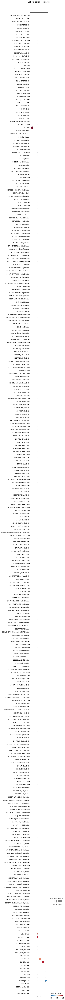

<timed exec>:30: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


CPU times: user 23 s, sys: 8.53 s, total: 31.5 s
Wall time: 19.8 s


In [82]:
%%time

# To Aggregate More Specific Cell Types
celltypist_rename = dict(
    Gabaergic=["GABA"], Glutamatergic=["Glut"],
    Dopaminergic=["Dopa"], Serotonergic=["Sero"],
    Inhibitory=["Inh"], Excitatory=["Exc"],
    Astrocyte=["Astro"],
    Microglia=["Microglia"],
    Pericyte=["peri"],
    Monocyte=["Monocyte"],
    Lymphoid=["Lymphoid"],
    Endothelial=["Endothelial", "Endo"],
    Oligodendrocyte=[r"^(?=.*oligo)(?!.*poly)(?!.*opc).*"],
    OPC=["OPC", "Polydend"])

# Run CellTypist
self.rna.X = self.rna.layers["counts"].copy()
sc.pp.normalize_total(self.rna, target_sum=10000)
sc.pp.log1p(self.rna) # copy=True: do not update adata.X
predictions = self.annotate(
    model_celltypist, col_celltype=col_celltype, layer=None,
    col_celltype_new="", majority_voting=True, min_prop=0.5, use_GPU=True)
if "majority_voting" in self.rna.obs:
    self.rna.obs.loc[:, "majority_voting_short"] = self.rna.obs[
        "majority_voting"].apply(lambda x: " ".join(x.split(
            " ")[1:]) if all((i in [str(i) for i in np.arange(
                0, 10)] for i in x.split(" ")[
                    0])) else x)  # drop pointless #s in front of cell types

# Rename Cell Types
rn_ct = predictions.predicted_labels.groupby("majority_voting").apply(
    lambda x: {x.name: " | ".join([
        j for j in celltypist_rename if any((re.search(
            i.lower(), x.name.lower()) for i in celltypist_rename[
                j]))])}).apply(lambda x: {list(x.keys())[0]: list(x.keys(
                    ))[0]} if x[list(x.keys())[0] ] == "" else x).apply(
                        lambda x: pd.Series(x)).stack().reset_index(
                            0, drop=True)
if "annotation_majority_voting" in self.rna.obs:
    self.rna.obs = self.rna.obs.drop("annotation_majority_voting", axis=1)
self.rna.obs = self.rna.obs.join(self.rna.obs.replace({
    "majority_voting": dict(rn_ct)})["majority_voting"].to_frame(
        "annotation_majority_voting"))
self.rna.X = self.rna.layers["scaled"].copy()

## Annotate with Map My Cells

- Make sure to run the following bash commonds after activating the conda environment used for this notebook.

- Pull [`cell_type_mapper`](https://github.com/AllenInstitute/cell_type_mapper) from GitHub (clone into your home directory): `cd && git clone git@github.com:AllenInstitute/cell_type_mapper.git`

- Navigate to that directory and run `pip install .`

- Navigate to the folder containing this notebook.

- Install ABC Atlas (while in same directory as this notebook): `pip install -U git+https://github.com/alleninstitute/abc_atlas_access >& scratch/junk.txt`

- Pull lookup files (while in same directory as this notebook):
```
cd resources
wget https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/mapmycells/WMB-10X/20240831/mouse_markers_230821.json
wget https://allen-brain-cell-atlas.s3-us-west-2.amazonaws.com/mapmycells/WMB-10X/20240831/precomputed_stats_ABC_revision_230821.h5
```

---

Note: To use GPU + Torch, you may need to alter the file "cell_type_mapper/src/cell_type_mapper/cell_by_gene/cell_by_gene.py" line `np.where(np.logical_not(np.isfinite(data)))[0]` to read instead

```
try:
    nan_rows = np.where(
        np.logical_not(np.isfinite(data.cpu().numpy())))[0]
except Exception:
    nan_rows = np.where(np.logical_not(np.isfinite(data)))[0]
```

You may have to run the following code in this notebook:

```
os.environ["NUMEXPR_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"
```

and

    `_correlation_dot_gpu()` in distance_utils.py change
    `correlation = torch.matmul(arr0, arr1)` to

```
try:
    correlation = torch.matmul(arr0, arr1)
except RuntimeError as err:
    if "CUBLAS_STATUS_NOT_INITIALIZED" in str(err):
        arr0_cpu = arr0.cpu()
        arr1_cpu = arr1.cpu()
        correlation = torch.matmul(arr0_cpu, arr1_cpu).to(arr0.device)
    else:
        raise
```

to manage processes/memory.

In [ ]:
# %%time

# # Write File to Use as Input for Map My Cells
# if overwrite is True or not os.path.exists(file_new):
#     os.makedirs("data", exist_ok=True)
#     self.rna.X = self.rna.layers["counts"]
#     self.rna.write_h5ad(file_new)
# else:
#     raise ValueError("Must be able to overwrite to run Map My Cells.")

# # Run Map My Cells
# self.rna = scflow.pp.run_mapbraincells(
#     file_new, map_my_cells_source=map_my_cells_source,
#     dir_scratch="scratch", dir_resources="resources",
#     validate_output_file="scratch/tmp.h5ad",  # map_to_ensembl=True,
#     map_my_cells_region_keys=map_my_cells_region_keys,
#     map_my_cells_cell_keys=map_my_cells_cell_keys, verbose_stdout=True,
#     n_processors=4, chunk_size=5000, max_gb=5)

# View Results
# _ = self.plot(kind="umap", color=["cellmap_class_name"])
# if "annotation_toppgene" in self.rna.obs:
#     print(self.rna.obs[["cellmap_class_name", "annotation_toppgene"]
#                        ].value_counts().sort_index())
# self.rna.obs[[i for i in self.rna.obs if "cellmap" in i and "ori" not in i]]

## Compare Annotations

annotation_by_overlap  annotation_scanvi  annotation_toppgene  annotation_majority_voting
Neuron                 Neuron             Excitatory           Glutamatergic                 43.2
                                                               Heterogeneous                 28.7
                                                               Gabaergic                     26.4
                                                               Inhibitory                     0.4
                       Microglial         Excitatory           Oligodendrocyte                0.3
                       Oligodendrocyte    Excitatory           Oligodendrocyte                0.3
                       Astrocyte          Excitatory           Heterogeneous                  0.2
                       OPC                Excitatory           Glutamatergic                  0.1
                       Microglial         Excitatory           Heterogeneous                  0.1
                       OPC  

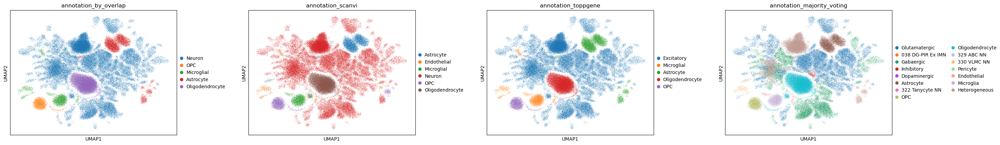

In [85]:
cols = ["annotation_by_overlap", "annotation_scanvi",
        "annotation_toppgene", "annotation_majority_voting"]
# cols += [i for i in [
#     "cellmap_class_name", "cellmap_subclass_name"] if i in self.rna.obs]
cols = [i for i in cols if i in self.rna.obs]

# Plot UMAPs
self.plot(kind="umap", color=cols, wspace=0.3)

# Compare
# self.rna.obs[cols].value_counts().reset_index().groupby(cols[0]).apply(
#         lambda x: x.sort_values("count", ascending=False).reset_index(
#                 drop=True), include_groups=False).reset_index(
#                         -1, drop=True).set_index(cols[1:], append=True)
self.rna.obs[cols].groupby(cols[0]).apply(
        lambda x: round(100 * x.value_counts(normalize=True), 1).sort_index(
                ).sort_values(ascending=False), include_groups=False)

# OSD-613-Specific

Clean variable names & keys

In [86]:
self.rna.obs.loc[:, "Age_Start"] = self.rna.obs["Factor Value[Age]"].astype(
    str) + " Weeks"
self.rna.obs.loc[:, "Age_End"] = self.rna.obs[
    "Characteristics[Age at Euthanasia]"].astype(str) + " Weeks"
self.rna.obs.loc[:, "Condition"] = self.rna.obs["Factor Value[Spaceflight]"]
if "cellmap_class_name" in self.rna.obs:  # cell name w/o region cues
    self.rna.obs.loc[:, "cellmap_class_name_collapsed"] = self.rna.obs[
        "cellmap_class_name"].apply(lambda x: x + "***" + str(
            "Glutamatergic-" if ("glut" in x.lower()) else "") + str(
                "GABAergic-" if "gaba" in x.lower() else "") + str(
                    "Oligodendrocyte-" if "oligo" in x.lower() else "") + str(
                        "Cholinergic-" if "chol" in x.lower() else ""))
    self.rna.obs.loc[:, "cellmap_class_name_collapsed"] = self.rna.obs[
        "cellmap_class_name_collapsed"].apply(
            lambda x: x.split("***")[0 if x.split("***")[1] == "" else 1])
    self.rna.obs.loc[:, "cellmap_class_name_collapsed"] = self.rna.obs[
        "cellmap_class_name_collapsed"].apply(
            lambda x: x[:-1] if x[-1] == "-" else x)

# Final Write

In [87]:
# Descriptives
if all((i in self.rna.obs for i in [
        "Factor Value[Age]", "Characteristics[Age at Euthanasia]"])):
    print(self.rna.obs[["Factor Value[Age]",
                        "Characteristics[Age at Euthanasia]"]].value_counts())

# Write h5ad
# self.rna.X = self.rna.layers["counts"].copy()
if overwrite is True or not os.path.exists(file_new):
    print("\n\n", f"Writing file to {file_new}...")
    self.rna.write_h5ad(file_new)

## Write Version Compatible with Older Packages
# adata = self.rna.copy()
# adata.uns = {}
# # adata.write_h5ad(os.path.splitext(file_new)[0] + "_compatible.h5ad")

# Send Email with Output When Done
if email is not None and html_out is not None:
    os.system(f"jupyter nbconvert --to html {cur_file}")
    os.system(f"echo 'yay' | mutt -s 'JOB DONE' -a {html_out} -- {email}")

Factor Value[Age]  Characteristics[Age at Euthanasia]
29                 37                                    55266
12                 20                                    48008
Name: count, dtype: int64


 Writing file to data/OSD-613_integrated.h5ad...


# SCRATCH (IGNORE)

In [ ]:
# mks_c = dict(zip(markers_predefined, [markers_predefined[x].intersection(
#         self.rna.var_names) for x in markers_predefined]))
# mks_c["Inhibitory"] = mks_c["Inhibitory"].difference(mks_c["Excitatory"])
# mks_c["Excitatory"] = mks_c["Excitatory"].difference(mks_c["Inhibitory"])
# endo = list(mks_c["Endothelial"].difference(set(functools.reduce(
#     lambda i, j: i + j, [list(
#         mks_c[i]) for i in mks_c if i != "Endothelial"]))))
# _ = self.plot(genes=endo, figsize=(15, 15),
#               col_celltype="annotation_scanvi",
#               # col_celltype="annotation_by_overlap",
#               layer="scaled", standard_scale="var", kind="matrix")